# Apple Leaf Diseases Detection Project

### Classifying images to detect if the apple leaf is healthy or not

#### Dataset:
 Kaggle Dataset: https://www.kaggle.com/competitions/plant-pathology-2020-fgvc7

#### Data: 

    The data contains 1821 color images of apple leaves and contains two types of files:

folder containing the train and test images, in jpg format, and CSV files.

## Project Methodology

### From Problem to Approach: Effictive Questioning

#### *What is the genneral problem?

    Misdiagnosis of agricultural illnesses can lead to the use of pesticides, increased input costs, and further outbreaks    that have negative effects on the economy and environment.

#### *What are the specific objectives?

    1/ Detect apple leaves that are sick, and in this case we focused on three diseases:

    1: scab; 2: rust; 3: multiple diseases; and also have healthy images.

    2/ use deep learning models.

    3/ Find the highest accuracy value and the lowest value for loss.

    4/ Test our models and find good results.

#### *Framing the problem:

    The problem is image classification using CNN and transfer learning.

#### *Designing the System:

    1/The output will be "healthy,"  "scab,"  "rust," or "multiple diseases."

    2/ We will have a multi-class classification task.



## Reading the data

In [3]:
import pandas as pd
import numpy as np
import os
import cv2
import seaborn as sns
import matplotlib.pyplot as plt
from keras.preprocessing.image import ImageDataGenerator
from sklearn.preprocessing import LabelEncoder
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense
import tensorflow as tf
from tensorflow.keras import models, layers
from keras.models import Model
from tqdm import tqdm_notebook as tqdm
import zipfile as zf

In [4]:
os.getcwd()

'C:\\Users\\NTECH'

In [5]:
os.chdir('Desktop')

In [4]:
dataset = zf.ZipFile("plant-pathology-2020-fgvc7.zip","r")

In [5]:
dataset.extractall("apple_dataset")

In [5]:
train_data =pd.read_csv(r"C:\Users\NTECH\Desktop\apple_dataset\train.csv")
test_data = pd.read_csv(r"C:\Users\NTECH\Desktop\apple_dataset\test.csv")

In [7]:
print("Training data shape : = {}".format(train_data.shape))
print("Test data shape : = {}".format(test_data.shape))

Training data shape : = (1821, 5)
Test data shape : = (1821, 1)


In [6]:
train_data.head()

,image_id,healthy,multiple_diseases,rust,scab
0,Train_0,0,0,0,1
1,Train_1,0,1,0,0
2,Train_2,1,0,0,0
3,Train_3,0,0,1,0
4,Train_4,1,0,0,0


In [8]:
# category - for each image_id 
def convert_dummies_to_category(df):
    data = df.copy()
    s2 = data[['healthy','multiple_diseases','rust','scab']].idxmax(axis=1)
    data = pd.concat([data,s2],axis=1)
    data.rename({0:'category'},axis=1,inplace=True)
    return data
  
# apply above function to find the category of the image
train_df = convert_dummies_to_category(train_data)
train_df.head()

,image_id,healthy,multiple_diseases,rust,scab,category
0,Train_0,0,0,0,1,scab
1,Train_1,0,1,0,0,multiple_diseases
2,Train_2,1,0,0,0,healthy
3,Train_3,0,0,1,0,rust
4,Train_4,1,0,0,0,healthy


In [9]:
image_folder_path = r'C:\Users\NTECH\Desktop\apple_dataset\images'

In [10]:
arr = train_data["image_id"]
train_images = [i for i in arr]  

arr = test_data["image_id"]
test_images = [i for i in arr]

In [11]:
def load_image(image_id):
    image_path = os.path.join(image_folder_path, image_id + '.jpg')
    if not os.path.exists(image_path):
        print(f"Error: image file {image_path} not found.")
        return None
    image = cv2.imread(image_path)
    if image is None:
        print(f"Error: could not read image file {image_path}.")
        return None
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    return image


*In this step we define a function called "load_image" that takes an "image_id" as input. The function is responsible for loading an image file with the given "image_id" from the "image_folder_path "directory.

First, the function constructs the path to the image file by concatenating the "image_folder_path" directory with the "image_id" and the ".jpg" extension.

Then, the function checks if the image file exists at the specified path using the "os.path.exists()" function. If the file does not exist, the function prints an error message and returns None.

If the image file exists, the function uses "OpenCV's cv2.imread()" function to read the image file into a numpy array. If the image cannot be read (e.g. due to file format issues), the function prints an error message and returns None.

Finally, the function converts the color channels of the image from "BGR" to "RGB" using the "cv2.cvtColor()" function and returns the resulting RGB image.

In [12]:
#Function for resize images
def resize(image, image_size):
    if image is None or image.size == 0:
        return None

    image = cv2.resize(image, (image_size[1], image_size[0]), interpolation=cv2.INTER_AREA)
    return image

## Exploritory Data Anlysis

Exploratory Data Analysis should focus on developing a thorough grasp of:

    the characteristics of the data, such as its statistical and schema features;
    the data's quality, including missing values and erroneous data types;
    the data's propensity to forecast, as evidenced by the connection of its properties with its intended use.

In [13]:
count_healthy = len(train_data[train_data["healthy"] == 1])
count_diseased = len(train_data[train_data["multiple_diseases"] == 1])
count_rust = len(train_data[train_data["rust"] == 1])
count_scab = len(train_data[train_data["scab"] == 1])

print("The count of healthy images :",count_healthy)
print("The count of Multiple diseases images :",count_diseased)
print("The count of rust images :",count_rust)
print("The count of scab images :",count_scab)
print("The total of images: ",count_healthy + count_diseased + count_rust +  count_scab)

The count of healthy images : 516
The count of Multiple diseases images : 91
The count of rust images : 622
The count of scab images : 592
The total of images:  1821


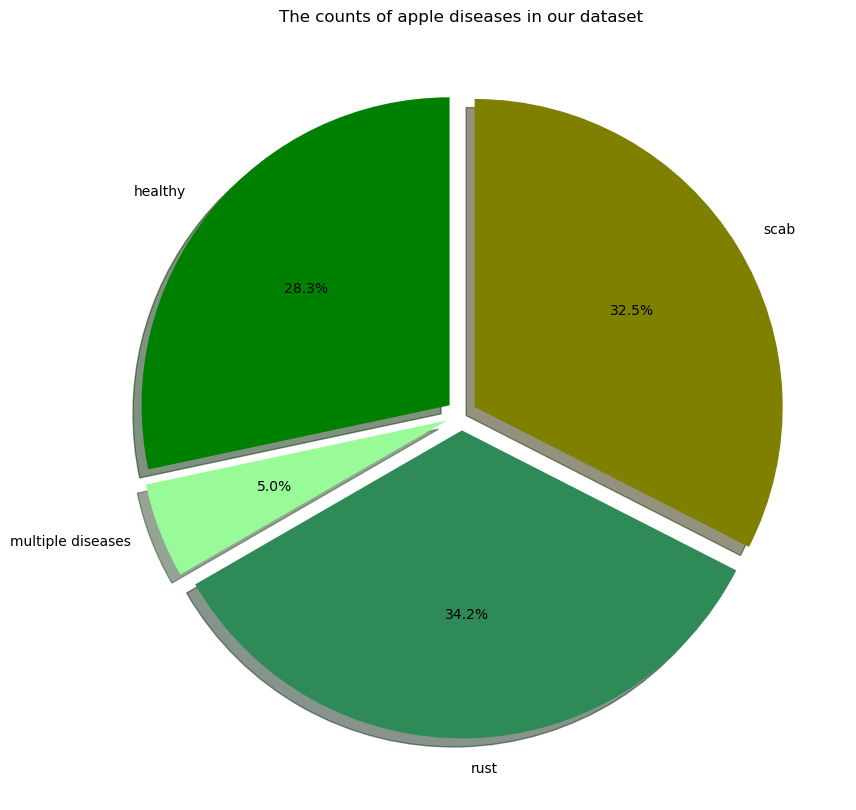

In [14]:
labels= ['healthy','multiple diseases','rust','scab']
counts = [count_healthy, count_diseased, count_rust, count_scab]
fig, ax = plt.subplots(figsize = (15, 10))
explode = (0.05, 0.05, 0.05, 0.05)
colors = ['green', 'palegreen', 'seagreen', 'olive']
ax.pie(counts, labels=labels,colors = colors, explode =explode,autopct='%1.1f%%', shadow = True, startangle=90)
plt.title('The counts of apple diseases in our dataset')
plt.show()

    From the result we obtained, there are many things we should note:

    *The scab and rust categories have the highest dataset.

    *The multiple disease category has the lowest dataset.

    This will put us in a problem because if we use this data for training, our models will not train well for the two last   categories.


### Plot some images to take a look at our dataset:

In [15]:
def get_img_label(img):
    ''' function to fetch the category of the image'''
    if search("Train",img):
        img = img.split('.')[0]
        category = train_df.loc[train_df['image_id']==img]['category']
        return category

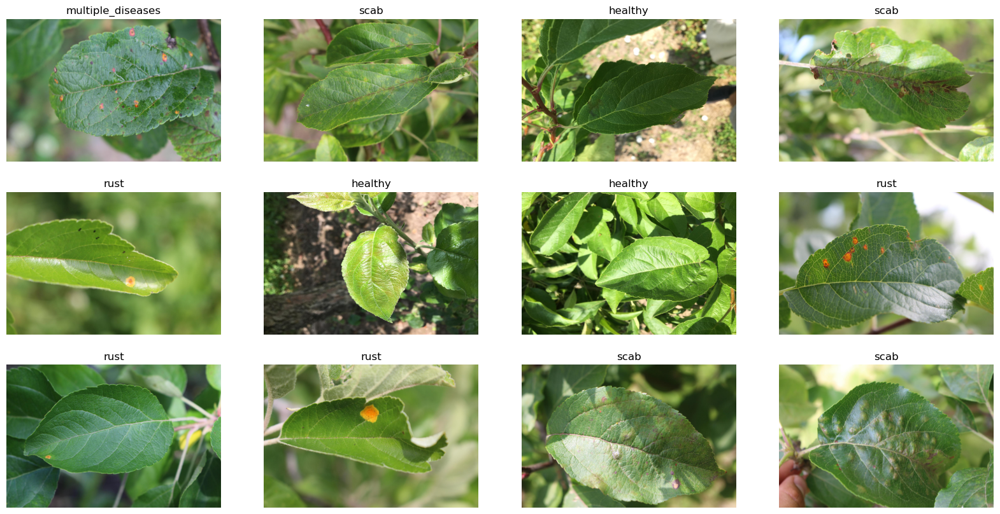

In [16]:
# lets check some images 
import random
import glob
from re import search
import matplotlib.image as mpimg
random_images = random.sample(glob.glob(os.path.join(image_folder_path,"Train_*.jpg")),12)
random_id = [img_path.split('\\')[-1] for img_path in random_images]


plt.figure(figsize=(20, 10))
for idx, img_path in enumerate(random_id):
    img_title = get_img_label(img_path)
    sp = plt.subplot(3, 4, idx+1)
    sp.axis('Off')
    complete_path = os.path.join(image_folder_path,img_path)
    mp_image = mpimg.imread(complete_path)
    plt.title(img_title.values[0])
    plt.imshow(mp_image) 

## Image Processing:


         Image processing is a crucial step in many machine learning applications that deal with visual data.It can be used to 
extract meaningful features from images, remove noise, improve image quality, and enhance the interpretability of the data.

         In addition, image processing is an important tool in machine learning for preprocessing and preparing visual data    for analysis and modeling.

     
       **In this step, we created functions to apply them to our dataset, and to see the result of each type of image processing, we applied the function to one image.

### 1- Image Denoising :

#### Note: 

    Image denoising techniques aim to remove the noise while preserving the useful information in the image. This can be done  
by applying filters or mathematical algorithms that analyze the image and remove the unwanted noise.

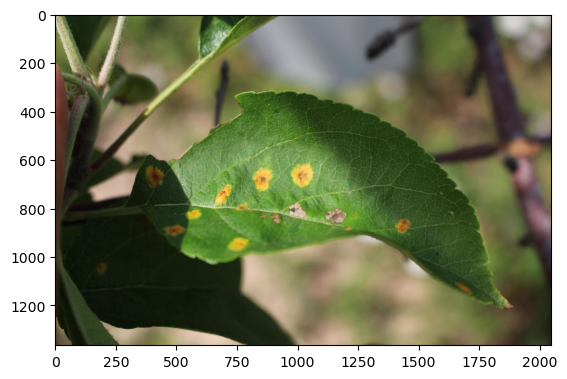

In [16]:
from PIL import Image

# Load the image from a file
sample_image = Image.open('apple_dataset\images\Train_37.jpg')

# Display the image
plt.imshow(sample_image)
plt.show()


In [17]:
image = cv2.imread('apple_dataset\images\Train_37.jpg')

# Convert the image to a NumPy ar|ray
img_array = np.array(image)

# Print the shape of the array
print(img_array.shape)

(1365, 2048, 3)


In [18]:
#Create a function for image Denoising 
def non_local_means_denoising(image) : 
    denoised_image = cv2.fastNlMeansDenoisingColored(image, None,  10, 10, 7, 21)
    return denoised_image

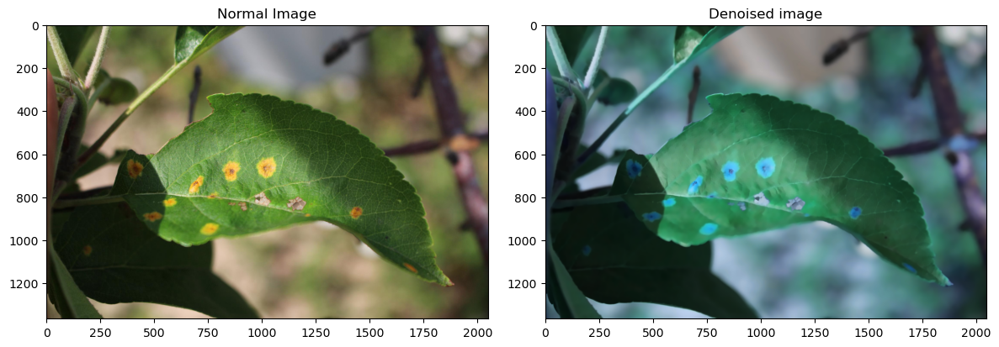

In [25]:
denoised_image = non_local_means_denoising(image)

plt.figure(figsize = (12, 8))
plt.subplot(1,2,1)
plt.imshow(sample_image, cmap = "gray")
plt.grid(False)
plt.title("Normal Image")

plt.subplot(1,2,2)  
plt.imshow(denoised_image, cmap = "gray")
plt.grid(False)
plt.title("Denoised image")    
# Automatically adjust subplot parameters to give specified padding.
plt.tight_layout()

###  2-Edge detection Using Sobel filter :

#### Note:
    
     Edge detection is a common image processing technique used to identify sharp transitions in image brightness or color  
values.The Sobel filter is a popular edge detection filter that is used to compute the gradient of an image intensity function. 

The gradient provides information about the rate of change in image intensity at each pixel location.

In [19]:
def sobel_edge_detection(image):
    
    sobelx = cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize=3)
    sobely = cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize=3)
    
    return sobelx, sobely
    
    

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


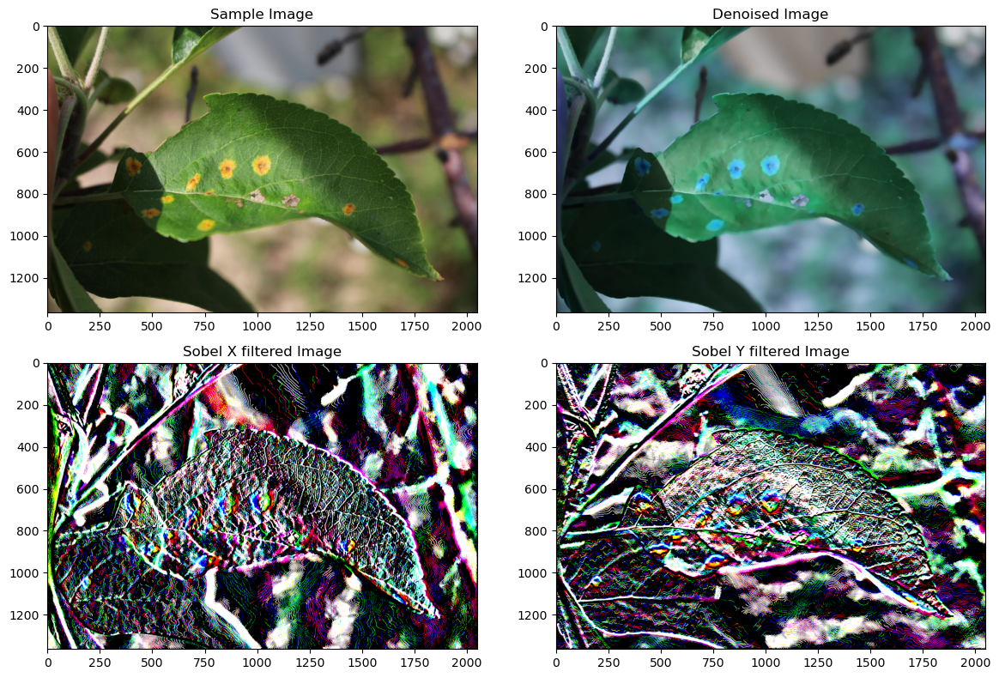

In [25]:
s_img_x, s_img_y = sobel_edge_detection(denoised_image)

plt.figure(figsize = (12, 8))
plt.subplot(2,2,1)
plt.imshow(sample_image, cmap = "gray")
plt.grid(False)
plt.title("Sample Image")

plt.subplot(2,2,2)
plt.imshow(denoised_image, cmap = "gray")
plt.grid(False)
plt.title("Denoised Image")

plt.subplot(2,2,3)
plt.imshow(s_img_x, cmap = "gray")
plt.grid(False)
plt.title("Sobel X filtered Image")

plt.subplot(2,2,4)
plt.imshow(s_img_y, cmap = "gray")
plt.grid(False)
plt.title("Sobel Y filtered Image")

# Automatically adjust subplot parameters to give specified padding.
plt.tight_layout()

### 3-Image Segmentation:

#### Note:

    The goal of image segmentation is to divide an image into meaningful and homogeneous regions that can be further     
analyzed, recognized, or manipulated. The resulting segments should have some perceptual or semantic relevance, such as objects,

regions, boundaries, or textures. The segmentation can be based on various features of the image, such as color, texture,

intensity, shape, or motion.

In [20]:
def segmentation(image, k, attempts) : 
    vectorized = np.float32(image.reshape((-1, 3)))
    criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 20, 1.0)
    res , label , center = cv2.kmeans(vectorized, k, None, criteria, attempts, cv2.KMEANS_PP_CENTERS)
    center = np.uint8(center)
    res = center[label.flatten()]
    
    segmented_image = res.reshape((image.shape))
    return segmented_image

Text(0.5, 1.0, 'Segmented Image with k = 5')

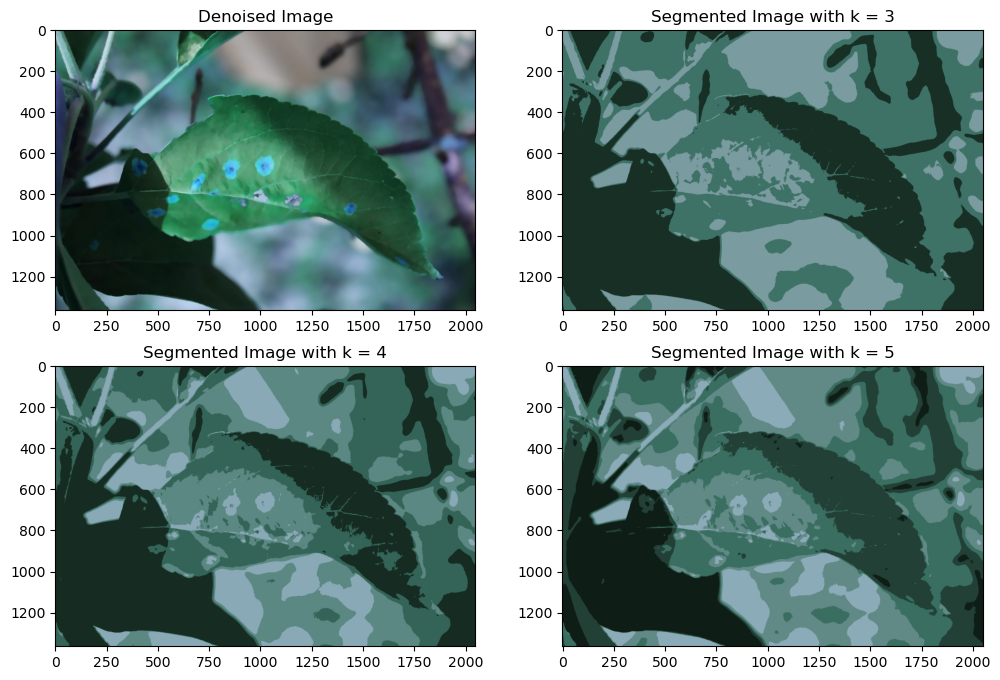

In [27]:
plt.figure(figsize = (12, 8))
plt.subplot(2,2,1)
plt.imshow(denoised_image, cmap = "gray")
plt.grid(False)
plt.title("Denoised Image")

segmented_image = segmentation(denoised_image, 3, 10) # k = 3, attempt = 10
plt.subplot(2,2,2)
plt.imshow(segmented_image, cmap = "gray")
plt.grid(False)
plt.title("Segmented Image with k = 3")

segmented_image = segmentation(denoised_image, 4, 10) # k = 4, attempt = 10
plt.subplot(2,2,3)
plt.imshow(segmented_image, cmap = "gray")
plt.grid(False)
plt.title("Segmented Image with k = 4")

segmented_image = segmentation(denoised_image, 5, 10) # k = 5, attempt = 10
plt.subplot(2,2,4)
plt.imshow(segmented_image, cmap = "gray")
plt.grid(False)
plt.title("Segmented Image with k = 5")

### 4-Data augmentation:

#### Note:
    Data augmentation is useful in scenarios where the amount of available data is limited, or the dataset is imbalanced,i.e, 
    
some classes have fewer examples than others. By applying data augmentation techniques, we can generate new samples that  are 

similar to the original ones but with different variations, making the dataset more balanced and increasing the robustness of the

model.

In [21]:
from keras.preprocessing.image import ImageDataGenerator
import matplotlib.pyplot as plt
import numpy as np

# define the data augmentation pipeline
data_aug = ImageDataGenerator(rotation_range=40,
                              zoom_range=0.2,
                              width_shift_range=0.1,
                              height_shift_range=0.1,
                              shear_range=0.1,
                              horizontal_flip=True,
                             fill_mode='nearest')

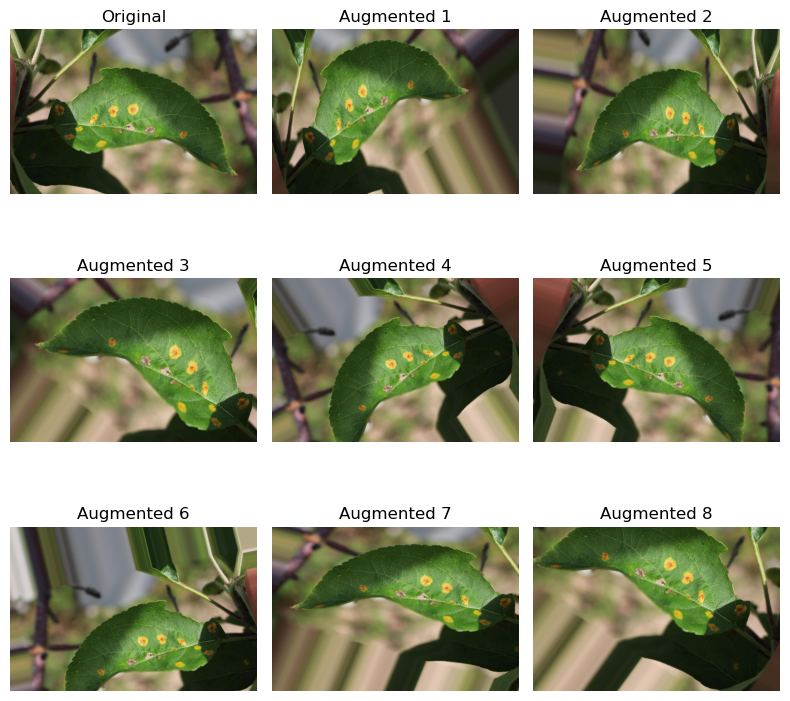

9 new images were generated.


In [22]:
def augment_images(image):
    # reshape the input image to the shape expected by the data augmentation pipeline
    image = image.reshape((1,) + image.shape)
    # generate a batch of augmented images using the data augmentation pipeline
    data = data_aug.flow(image)
    # return the first augmented image in the batch
    return data.next()[0].astype('uint8')

# load the image
image = plt.imread('apple_dataset\images\Train_37.jpg')

# plot the original image and the generated images
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(8, 8))
axes[0, 0].imshow(image)
axes[0, 0].set_title('Original')
axes[0, 0].axis('off')
for i in range(1, 9):
    augmented = augment_images(image)
    axes[i // 3, i % 3].imshow(augmented)
    axes[i // 3, i % 3].set_title(f'Augmented {i}')
    axes[i // 3, i % 3].axis('off')
    count = 1+i
plt.tight_layout()
plt.show()


# print the number of generated images
print(count,'new images were generated.')

## Preparing the dataset for Deep Learning:

In [23]:
IMAGE_SIZE = (224, 224, 3)

In [24]:
train_image = []
for id in tqdm(train_data["image_id"]):
    image = load_image(id)
    image = resize(image, IMAGE_SIZE)
    
    seg_image = segmentation(image, 4, 10)
    aug_images = augment_images(image)
    edge_detection = sobel_edge_detection(image)
    
    
    train_image.append(image)

C:\Users\NTECH\AppData\Local\Temp\ipykernel_10872\1544150181.py:2: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for id in tqdm(train_data["image_id"]):


  0%|          | 0/1821 [00:00<?, ?it/s]

    In this part, we prepare the training data for a machine learning model. All the processed images (original, segmented,
    
augmented, and edge-detected) are then appended to the train_image list. This list will be used to train machine learning models

in our project.

In [25]:
x_train = np.array(train_image)
x_train = x_train/255.0
y = train_data.copy()
del y["image_id"]
y_train = np.array(y.values)

In [26]:
print(x_train.shape)
print(y_train.shape)

(1821, 224, 224, 3)
(1821, 4)


In [27]:
sample = x_train[100]
sample.shape

(224, 224, 3)

Label =  [1 0 0 0]


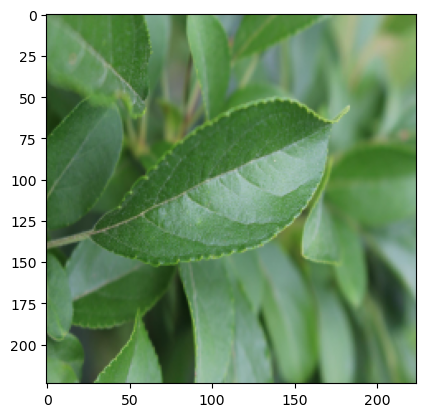

In [28]:
plt.imshow(sample)
print("Label = ", y_train[5])

## Handling Imbalanced Dataset :

    Exploratory data analysis showed that the'multiple disease' class was in the minority, creating an imbalance between the 
class distributions. To address this, the SMOTE algorithm will be used to increase the minority class.

   ### SMOTE :

    The aim of SMOTE (Synthetic Minority Over-sampling Technique) is to balance imbalanced datasets by generating synthetic samples of the minority class. It works by generating new samples in the feature space between existing minority class  samples. This can improve the performance of machine learning models, as they tend to perform poorly when there is a    class imbalance. SMOTE can be used to oversample the minority class, but it can also be used in combination with undersampling techniques to balance the dataset.

#### Here is the link to the documentation of SMOTE in imblearn library: 
  https://imbalanced-learn.org/stable/over_sampling.html#smote-variants

In [28]:
from imblearn.over_sampling import SMOTE
smote = SMOTE(random_state = 115)
x_train, y_train = smote.fit_resample(x_train.reshape((-1, IMAGE_SIZE[0] * IMAGE_SIZE[1] * 3)), y_train)
x_train = x_train.reshape((-1, IMAGE_SIZE[0], IMAGE_SIZE[1], 3))
print(x_train.shape)
print(y_train.shape)

(2488, 224, 224, 3)
(2488, 4)


In [29]:
y_train


array([[0, 0, 0, 1],
       [0, 1, 0, 0],
       [1, 0, 0, 0],
       ...,
       [0, 0, 0, 1],
       [0, 0, 0, 1],
       [0, 0, 0, 1]])

In [30]:
def label_count(label) :    
    count = 0 
    for entry in y_train :
        if np.array_equal(label, entry):    
            count += 1
    return count     

In [31]:
healthy = np.array([1,0,0,0])
multiple_diseases = np.array([0,1,0,0])
rust = np.array([0,0,1,0])
scab = np.array([0,0,0,1])

In [32]:
count_healthy = label_count(healthy)
count_multiple_diseases = label_count(multiple_diseases)
count_rust = label_count(rust)
count_scab = label_count(scab)



In [33]:
print("The count of healthy images :",count_healthy)
print("The count of Multiple diseases images :",count_multiple_diseases )
print("The count of rust images :",count_rust)
print("The count of scab images :",count_scab)
print("The total of images: ",count_healthy + count_multiple_diseases  + count_rust +  count_scab)

The count of healthy images : 622
The count of Multiple diseases images : 622
The count of rust images : 622
The count of scab images : 622
The total of images:  2488


([<matplotlib.patches.Wedge at 0x1365af84d00>,
 [Text(-0.8131727983645297, 0.8131727983645298, 'Healthy'),
  Text(-0.8131727983645299, -0.8131727983645297, 'Multiple Diseased'),
  Text(0.8131727983645296, -0.8131727983645299, 'Rust'),
  Text(0.8131727983645299, 0.8131727983645296, 'Scab')],
 [Text(-0.4596194077712558, 0.4596194077712559, '25.0%'),
  Text(-0.459619407771256, -0.4596194077712558, '25.0%'),
  Text(0.45961940777125576, -0.459619407771256, '25.0%'),
  Text(0.459619407771256, 0.45961940777125576, '25.0%')])

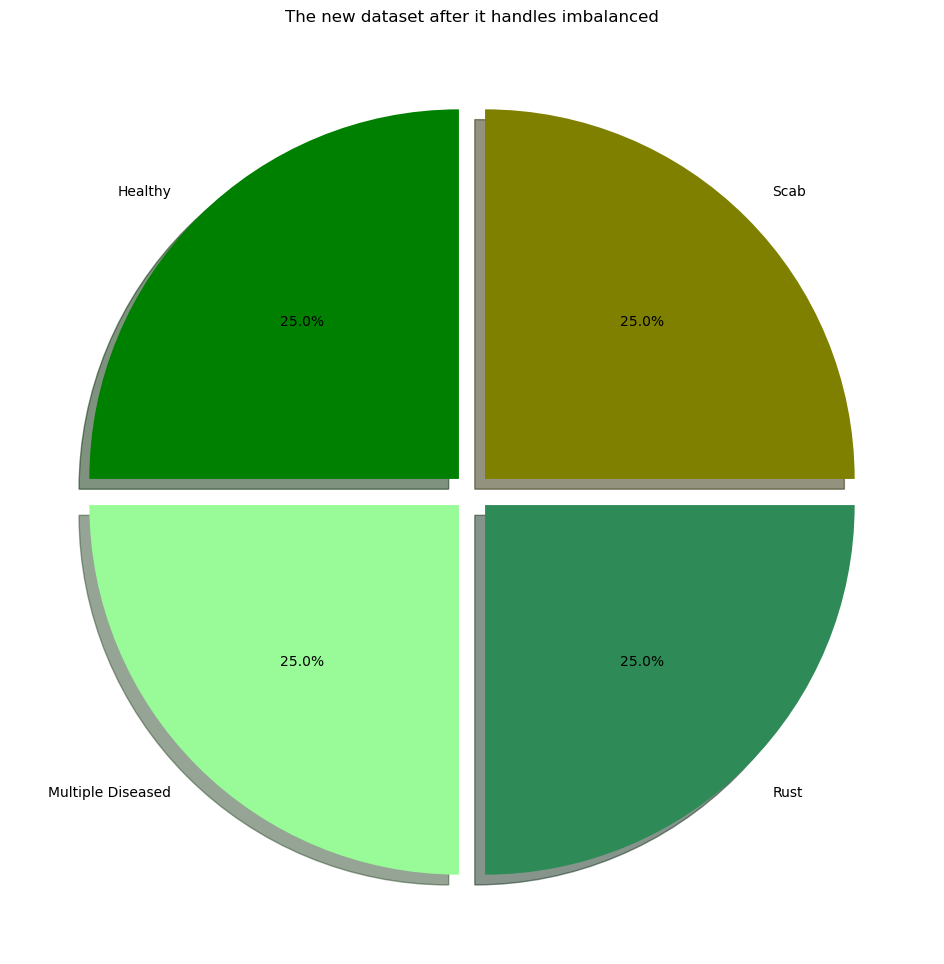

In [34]:
labels = ["Healthy", "Multiple Diseased", "Rust", "Scab"]
counts = [count_healthy, count_multiple_diseases, count_rust, count_scab]
explode = (0.05, 0.05, 0.05, 0.05)
colors = ['green', 'palegreen', 'seagreen', 'olive']
fig, ax = plt.subplots(figsize = (20, 12))
plt.title('The new dataset after it handles imbalanced')

ax.pie(counts, explode = explode, labels = labels, colors=colors, autopct='%1.1f%%', shadow = True, startangle = 90)


## Split the training dataset:

In [35]:
VALIDATION_FACTOR = 0.1

val_size = int(len(x_train) * VALIDATION_FACTOR)

train_x = x_train[: len(x_train) - val_size]
train_y = y_train[: len(y_train) - val_size] # len(x_train) = len(y_train)

val_x = x_train[len(x_train) - val_size : len(x_train)]
val_y = y_train[len(y_train) - val_size : len(y_train)]

print("Shape of training data = ", train_x.shape, train_y.shape)
print("Shape of validation data = ", val_x.shape, val_y.shape)

Shape of training data =  (2240, 224, 224, 3) (2240, 4)
Shape of validation data =  (248, 224, 224, 3) (248, 4)


    In this case, the validation factor is set to 0.1, meaning that 10% of the training set will be used for validation.

### Important Note:

       I tried to change the percentage of validation , and I put 20% , but the transfer learning model doesn't give me good results in accuracy and loss.

## Configure GPU for Deep Learning:

    Configuring GPU for Deep Learning is important because deep learning models require a lot of computation,especially when 
working with large datasets.

    By configuring a GPU for deep learning, we can significantly speed up the training process and reduce the time it takes to 
develop and test deep learning models

     In summary,configuring a GPU for deep learning is important because it can save time and improve the overall performance
of the models.

In [36]:
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
gpus = tf.config.list_physical_devices("GPU")
print(gpus)
if len(gpus) == 1 : 
    strategy = tf.distribute.OneDeviceStrategy(device = "/gpu:0")
else:
    strategy = tf.distribute.MirroredStrategy()
    

[]
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:CPU:0',)


In [37]:
tf.config.optimizer.set_experimental_options({"auto_mixed_precision" : True})
print("Mixed precision enabled")

Mixed precision enabled


## Early Stopping and Model Checkpoint:

### Note:

    Combining early stopping andmodel checkpoint can help improve the accuracy of the model while also preventing overfitting
    The early stopping technique will stop the training process when the model starts to overfit,  and  the model checkpoint will save the best weights during training, ensuring that we have the most accurate model possible.

In [49]:
from tensorflow.keras.callbacks import ModelCheckpoint,EarlyStopping
checkpoint=ModelCheckpoint(r'C:\Users\NTECH\Desktop\dataset\apple2.h5',
                          monitor='val_loss',
                          mode='min',
                          save_best_only=True,
                          verbose=1)
earlystop=EarlyStopping(monitor='val_loss',
                       min_delta=0,
                       patience=25,
                       verbose=0,
                       restore_best_weights=True)

callbacks=[checkpoint,earlystop]

## Extract bottleneck features:

    The function uses 'predict' method to extract bottleneck features from the 'deep_learning_model' and 'input_images'.It 
returns the bottleneck features as the output of the function.

    The function is using GPU for processing the bottleneck features. This is done using 'tf.device'method with the argument 
"/device:GPU:0". This ensures that the processing is done on the GPU if it is available, which can significantly speed up      the processing time.

In [38]:
def get_bottleneck_features(deep_learning_model, input_images) :
   
    with tf.device("/device:GPU:0"):
        bottleneck_features = deep_learning_model.predict(input_images, verbose = 1)
        return bottleneck_features


# Transfer Learning Models

##### VGG16 Model

In [47]:
vgg = tf.keras.applications.vgg16.VGG16(include_top = False, weights = "imagenet", input_shape = IMAGE_SIZE)

In [48]:
vgg.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

In [49]:
vgg.input

<KerasTensor: shape=(None, 224, 224, 3) dtype=float32 (created by layer 'input_1')>

In [50]:
vgg.layers[-1].output

<KerasTensor: shape=(None, 7, 7, 512) dtype=float32 (created by layer 'block5_pool')>

In [51]:
output = vgg.layers[-1].output
output = tf.keras.layers.GlobalAveragePooling2D()(output)
vgg_model = tf.keras.models.Model(vgg.input, output)

In [52]:
for layer in vgg.layers:
    layer.trainable=False

In [53]:
training_bottleneck_features = get_bottleneck_features(vgg_model, train_x)
validation_bottleneck_features = get_bottleneck_features(vgg_model, val_x)
print("Shape of training bottleneck features = ", training_bottleneck_features.shape)
print("Shape of validation bottleneck features = ", validation_bottleneck_features.shape)

8/8 [==============================] - 104s 13s/step
Shape of training bottleneck features =  (2240, 512)
Shape of validation bottleneck features =  (248, 512)


In [224]:
vgg_model.output_shape[1]

512

In [225]:
from tensorflow.keras.regularizers import l2
input_shape = vgg_model.output_shape[1]

VGG_model = tf.keras.models.Sequential()
VGG_model.add(tf.keras.layers.InputLayer(input_shape = (input_shape, )))

VGG_model.add(tf.keras.layers.Dense(512, activation = "relu", input_dim = input_shape))
#VGG_model.add(tf.keras.layers.Dropout(0.2))


VGG_model.add(tf.keras.layers.Dense(512, activation = "relu"))
#VGG_model.add(tf.keras.layers.Dropout(0.2))
#VGG_model.add(tf.keras.layers.BatchNormalization())
VGG_model.add(tf.keras.layers.Dense(512, activation = "relu"))

          
VGG_model.add(tf.keras.layers.Dense(4, activation = "softmax"))

VGG_model.summary() 

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_7 (Dense)             (None, 512)               262656    
                                                                 
 dense_8 (Dense)             (None, 512)               262656    
                                                                 
 dense_9 (Dense)             (None, 512)               262656    
                                                                 
 dense_10 (Dense)            (None, 4)                 2052      
                                                                 
Total params: 790,020
Trainable params: 790,020
Non-trainable params: 0
_________________________________________________________________


In [58]:
VGG_model.compile(loss='categorical_crossentropy',
                  optimizer='adam', 
                  metrics=['accuracy'])

In [64]:
BATCH_SIZE = 64
EPOCHS = 100
with tf.device("/device:GPU:0"): #with tf.device("/device:GPU:0"):
    history = VGG_model.fit(x = training_bottleneck_features, 
                        y = train_y,
                        validation_data = (validation_bottleneck_features, val_y),
                        batch_size = BATCH_SIZE, 
                        epochs= EPOCHS, 
                        verbose = 1,
                        callbacks=callbacks
                       )

Epoch 1/100
34/35 [============================>.] - ETA: 0s - loss: 0.0232 - accuracy: 0.9949
Epoch 1: val_loss did not improve from 0.30545
35/35 [==============================] - 1s 21ms/step - loss: 0.0238 - accuracy: 0.9946 - val_loss: 0.4845 - val_accuracy: 0.9315
Epoch 2/100
34/35 [============================>.] - ETA: 0s - loss: 0.0288 - accuracy: 0.9926
Epoch 2: val_loss did not improve from 0.30545
35/35 [==============================] - 1s 20ms/step - loss: 0.0296 - accuracy: 0.9920 - val_loss: 0.4863 - val_accuracy: 0.9315
Epoch 3/100
34/35 [============================>.] - ETA: 0s - loss: 0.0739 - accuracy: 0.9733
Epoch 3: val_loss did not improve from 0.30545
35/35 [==============================] - 1s 20ms/step - loss: 0.0730 - accuracy: 0.9741 - val_loss: 0.4340 - val_accuracy: 0.9516
Epoch 4/100
33/35 [===========================>..] - ETA: 0s - loss: 0.0681 - accuracy: 0.9782
Epoch 4: val_loss did not improve from 0.30545
35/35 [==============================] - 1

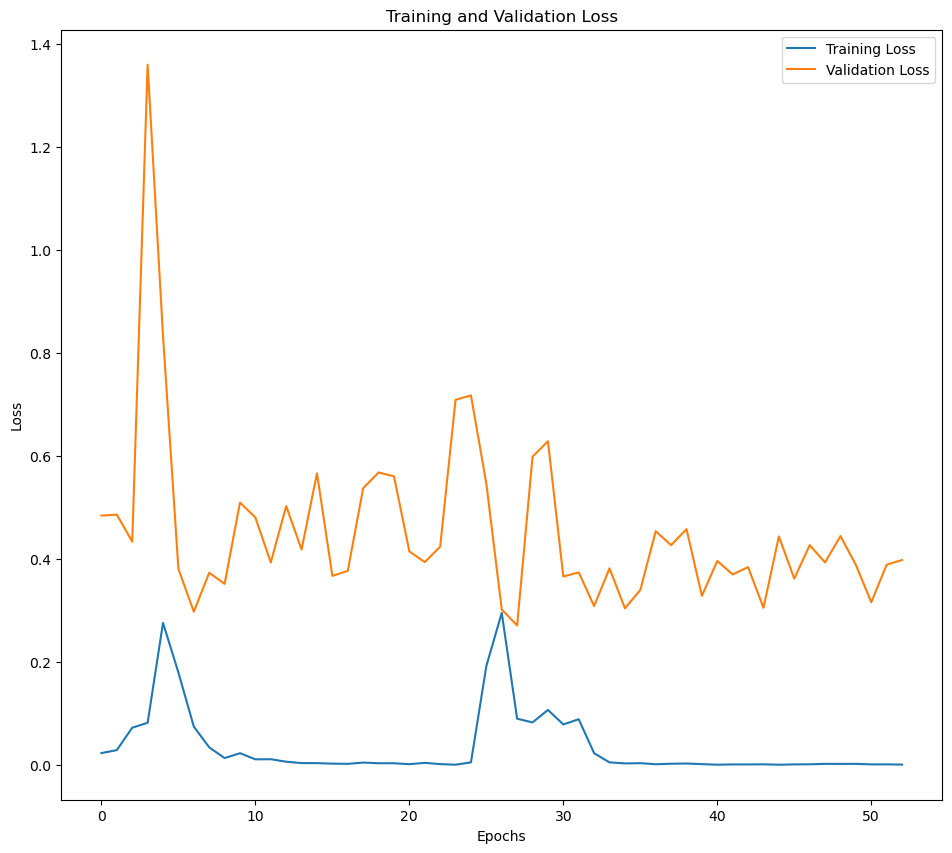

In [66]:
X = np.arange(0,53,1)
plt.figure(1, figsize = (25, 10))
plt.subplot(1,2,1)
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Training and Validation Loss")
plt.plot(X, history.history["loss"], label = "Training Loss")
plt.plot(X, history.history["val_loss"], label = "Validation Loss")
plt.legend()

In [ ]:
plt.figure(1, figsize = (25, 10))
plt.subplot(1,2,2)
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.title("Training and Validation Accuracy")
plt.plot(X, history.history["accuracy"], label = "Training Accuracy")
plt.plot(X, history.history["val_accuracy"], label = "Validation Accuracy")

plt.legend()

##### Change  the optimezer function with "RAdam"

In [45]:
!pip install tensorflow-addons


Defaulting to user installation because normal site-packages is not writeable


In [46]:
import tensorflow_addons as tfa
from tensorflow.keras.applications import VGG16
# Replace the optimizer with RAdam
radam_optimizer = tfa.optimizers.RectifiedAdam()
VGG_model.compile(loss='categorical_crossentropy', 
                  optimizer=radam_optimizer,
                  metrics=['accuracy'])


C:\Users\NTECH\AppData\Roaming\Python\Python310\site-packages\tensorflow_addons\utils\tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(


NameError: name 'VGG_model' is not defined

In [90]:
BATCH_SIZE = 64
EPOCHS = 100
with tf.device("/device:GPU:0"):
    history = VGG_model.fit(x = training_bottleneck_features, 
                        y = train_y,
                        validation_data = (validation_bottleneck_features, val_y),
                        batch_size = BATCH_SIZE, 
                        epochs= EPOCHS, 
                        verbose = 1,
                        callbacks=callbacks
                       )

Epoch 1/100
35/35 [==============================] - ETA: 0s - loss: 0.1190 - accuracy: 0.9598
Epoch 1: val_loss did not improve from 0.18756
35/35 [==============================] - 1s 37ms/step - loss: 0.1190 - accuracy: 0.9598 - val_loss: 0.4734 - val_accuracy: 0.9073
Epoch 2/100
35/35 [==============================] - ETA: 0s - loss: 0.2564 - accuracy: 0.9098
Epoch 2: val_loss did not improve from 0.18756
35/35 [==============================] - 1s 34ms/step - loss: 0.2564 - accuracy: 0.9098 - val_loss: 0.3392 - val_accuracy: 0.9315
Epoch 3/100
35/35 [==============================] - ETA: 0s - loss: 0.0845 - accuracy: 0.9688
Epoch 3: val_loss did not improve from 0.18756
35/35 [==============================] - 1s 34ms/step - loss: 0.0845 - accuracy: 0.9688 - val_loss: 0.6473 - val_accuracy: 0.8750
Epoch 4/100
35/35 [==============================] - ETA: 0s - loss: 0.0452 - accuracy: 0.9857
Epoch 4: val_loss did not improve from 0.18756
35/35 [==============================] - 1

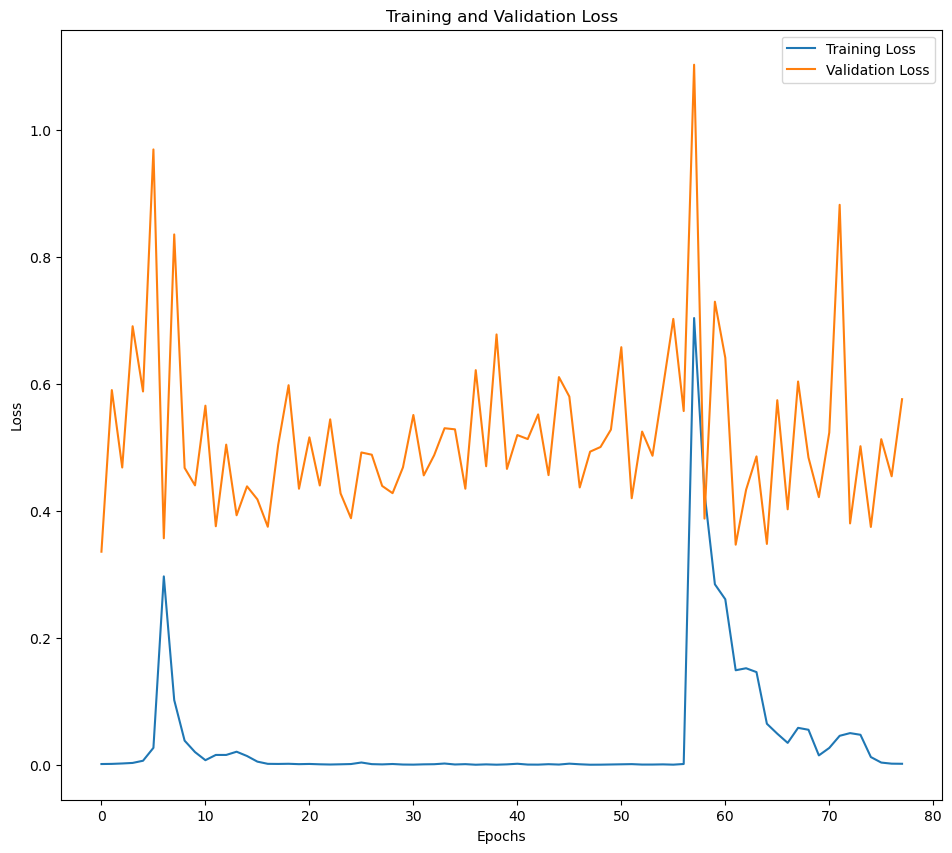

In [148]:
X = np.arange(0,78,1)
plt.figure(1, figsize = (25, 10))
plt.subplot(1,2,1)
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Training and Validation Loss")
plt.plot(X, history.history["loss"], label = "Training Loss")
plt.plot(X, history.history["val_loss"], label = "Validation Loss")
plt.legend()

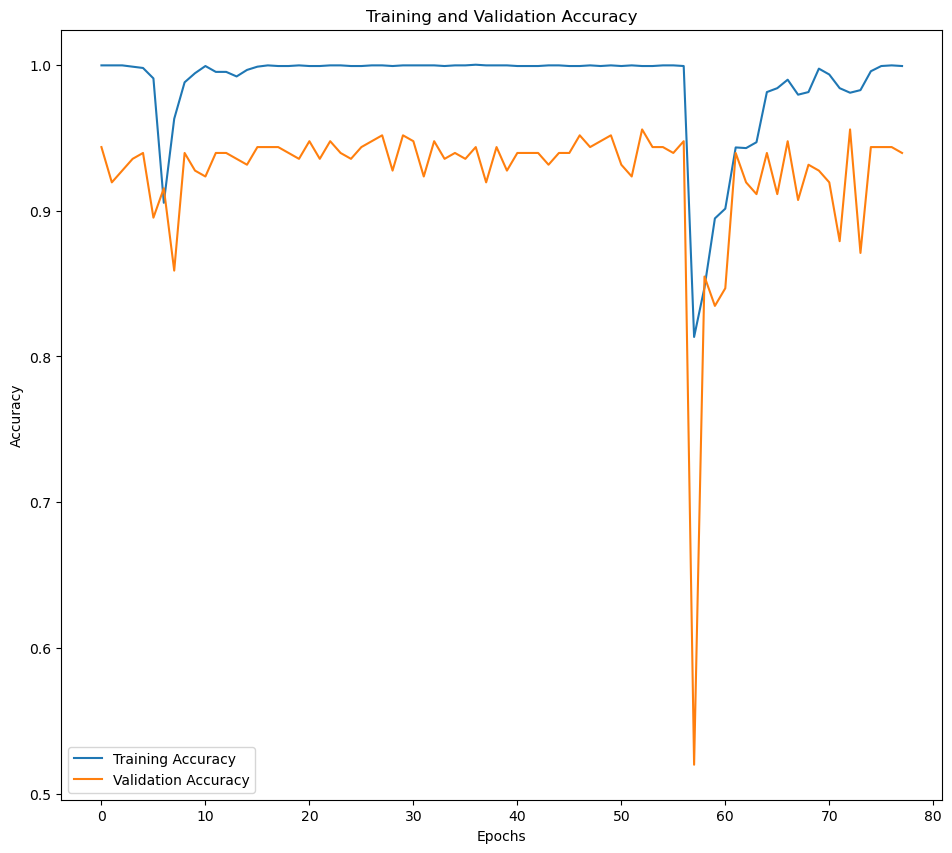

In [149]:
plt.figure(1, figsize = (25, 10))
plt.subplot(1,2,2)
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.title("Training and Validation Accuracy")
plt.plot(X, history.history["accuracy"], label = "Training Accuracy")
plt.plot(X, history.history["val_accuracy"], label = "Validation Accuracy")

plt.legend()

##### In this step we can change the learning rate[0.0001,0.0005,0.01] and change batch_size values[64, 100,138].

In [226]:
from tensorflow.keras.callbacks import ModelCheckpoint,EarlyStopping
checkpoint=ModelCheckpoint(r'C:\Users\NTECH\Desktop\dataset\0.0001vgg100apple2.h5',
                          monitor='val_accuracy',
                          mode='max',
                          save_best_only=True,
                          verbose=1)
earlystop=EarlyStopping(monitor='val_accuracy',
                       min_delta=0,
                       patience=25,
                       verbose=0,
                       restore_best_weights=True)

callbacks=[checkpoint,earlystop]

In [227]:
from tensorflow.keras.optimizers import Adam
optimizer = Adam(learning_rate=0.0001)

# Compile the model with the optimizer
VGG_model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

In [240]:
BATCH_SIZE = 100
EPOCHS = 100
with tf.device("/device:GPU:0"): #with tf.device("/device:GPU:0"):
    history = VGG_model.fit(x = training_bottleneck_features, 
                        y = train_y,
                        validation_data = (validation_bottleneck_features, val_y),
                        batch_size = BATCH_SIZE, 
                        epochs= EPOCHS, 
                        verbose = 1,
                        callbacks=callbacks
                       )

Epoch 1/100
21/23 [==========================>...] - ETA: 0s - loss: 0.0334 - accuracy: 0.9990
Epoch 1: val_accuracy did not improve from 0.95161
23/23 [==============================] - 1s 26ms/step - loss: 0.0334 - accuracy: 0.9991 - val_loss: 0.3252 - val_accuracy: 0.9355
Epoch 2/100
23/23 [==============================] - ETA: 0s - loss: 0.0373 - accuracy: 0.9987
Epoch 2: val_accuracy did not improve from 0.95161
23/23 [==============================] - 1s 23ms/step - loss: 0.0373 - accuracy: 0.9987 - val_loss: 0.3051 - val_accuracy: 0.9435
Epoch 3/100
22/23 [===========================>..] - ETA: 0s - loss: 0.0327 - accuracy: 0.9982
Epoch 3: val_accuracy did not improve from 0.95161
23/23 [==============================] - 1s 22ms/step - loss: 0.0324 - accuracy: 0.9982 - val_loss: 0.2734 - val_accuracy: 0.9435
Epoch 4/100
22/23 [===========================>..] - ETA: 0s - loss: 0.0350 - accuracy: 0.9982
Epoch 4: val_accuracy did not improve from 0.95161
23/23 [===================

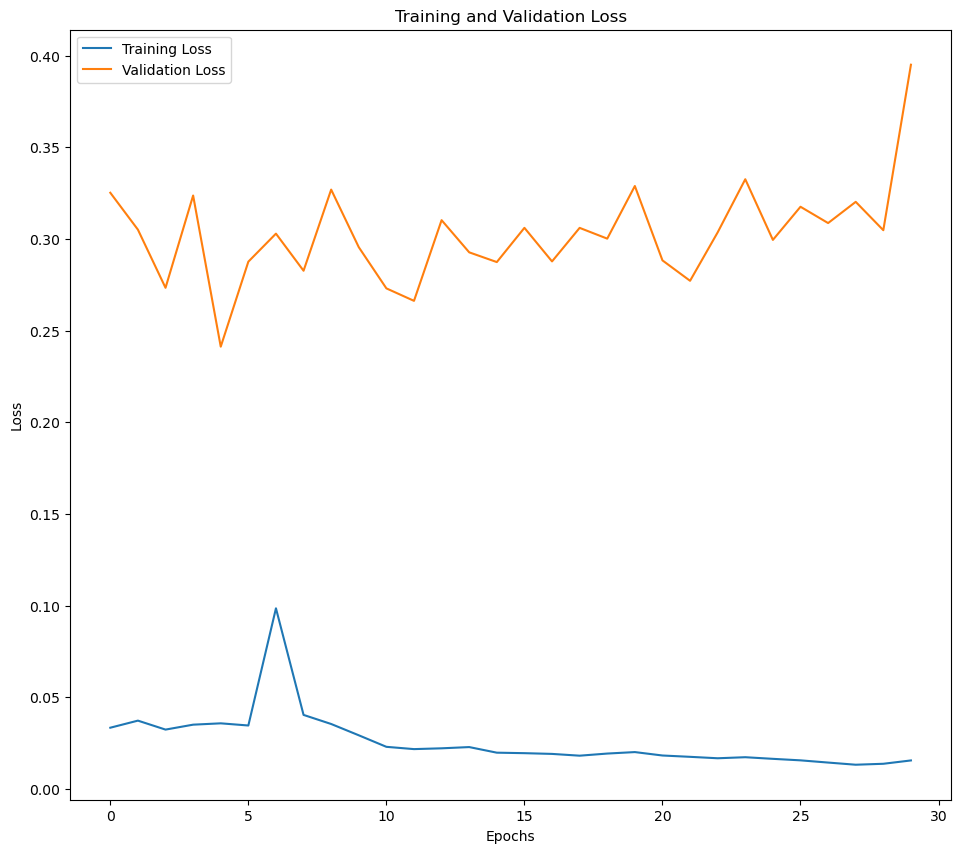

In [241]:
X = np.arange(0,30,1)
plt.figure(1, figsize = (25, 10))
plt.subplot(1,2,1)
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Training and Validation Loss")
plt.plot(X, history.history["loss"], label = "Training Loss")
plt.plot(X, history.history["val_loss"], label = "Validation Loss")
plt.legend()

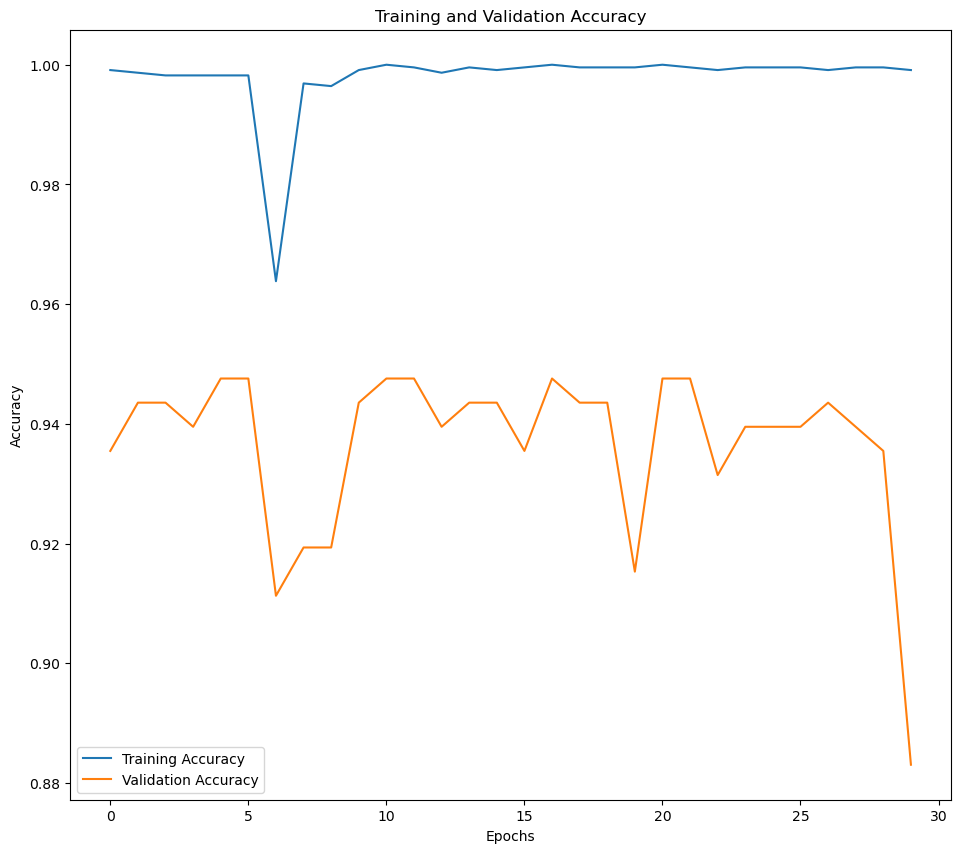

In [242]:
plt.figure(1, figsize = (25, 10))
plt.subplot(1,2,2)
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.title("Training and Validation Accuracy")
plt.plot(X, history.history["accuracy"], label = "Training Accuracy")
plt.plot(X, history.history["val_accuracy"], label = "Validation Accuracy")

plt.legend()

###### CNN Model

In [199]:
cnn_model = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(32,(3,3), activation = 'relu',input_shape = (224,224,3)),
    tf.keras.layers.MaxPooling2D(2,2),
    #Ajouter le 2éme couche de convolution
    tf.keras.layers.Conv2D(64,(3,3), activation = 'relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    
    #étaller les données en un seul vecteur
    tf.keras.layers.Flatten(),
    #Les couches fully connected
    tf.keras.layers.Dense(512,activation = 'relu'),
    tf.keras.layers.Dense(4, activation = 'softmax')

])

In [200]:
cnn_model.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_96 (Conv2D)          (None, 222, 222, 32)      896       
                                                                 
 max_pooling2d_6 (MaxPooling  (None, 111, 111, 32)     0         
 2D)                                                             
                                                                 
 conv2d_97 (Conv2D)          (None, 109, 109, 64)      18496     
                                                                 
 max_pooling2d_7 (MaxPooling  (None, 54, 54, 64)       0         
 2D)                                                             
                                                                 
 flatten_1 (Flatten)         (None, 186624)            0         
                                                                 
 dense_11 (Dense)            (None, 512)              

In [201]:
cnn_model.compile(loss='categorical_crossentropy', 
              optimizer='adam', 
              metrics=['accuracy'])

In [238]:
# Train the model
BATCH_SIZE = 64
EPOCHS = 100
with tf.device("/device:GPU:0"): #with tf.device("/device:GPU:0"):
        history = cnn_model.fit(train_x, 
                            train_y, 
                            batch_size=BATCH_SIZE, 
                            epochs=EPOCHS, 
                            validation_data=(val_x, val_y), 
                            callbacks=callbacks
                               )


Epoch 1/100
70/70 [==============================] - ETA: 0s - loss: 2.4483 - accuracy: 0.3411
Epoch 1: val_loss did not improve from 0.09830
70/70 [==============================] - 213s 3s/step - loss: 2.4483 - accuracy: 0.3411 - val_loss: 1.4805 - val_accuracy: 0.3952
Epoch 2/100
70/70 [==============================] - ETA: 0s - loss: 0.9867 - accuracy: 0.5897
Epoch 2: val_loss did not improve from 0.09830
70/70 [==============================] - 201s 3s/step - loss: 0.9867 - accuracy: 0.5897 - val_loss: 0.4890 - val_accuracy: 0.9355
Epoch 3/100
70/70 [==============================] - ETA: 0s - loss: 0.4536 - accuracy: 0.8371
Epoch 3: val_loss did not improve from 0.09830
70/70 [==============================] - 196s 3s/step - loss: 0.4536 - accuracy: 0.8371 - val_loss: 0.1087 - val_accuracy: 0.9919
Epoch 4/100
70/70 [==============================] - ETA: 0s - loss: 0.1841 - accuracy: 0.9460
Epoch 4: val_loss improved from 0.09830 to 0.03571, saving model to C:\Users\NTECH\Deskto

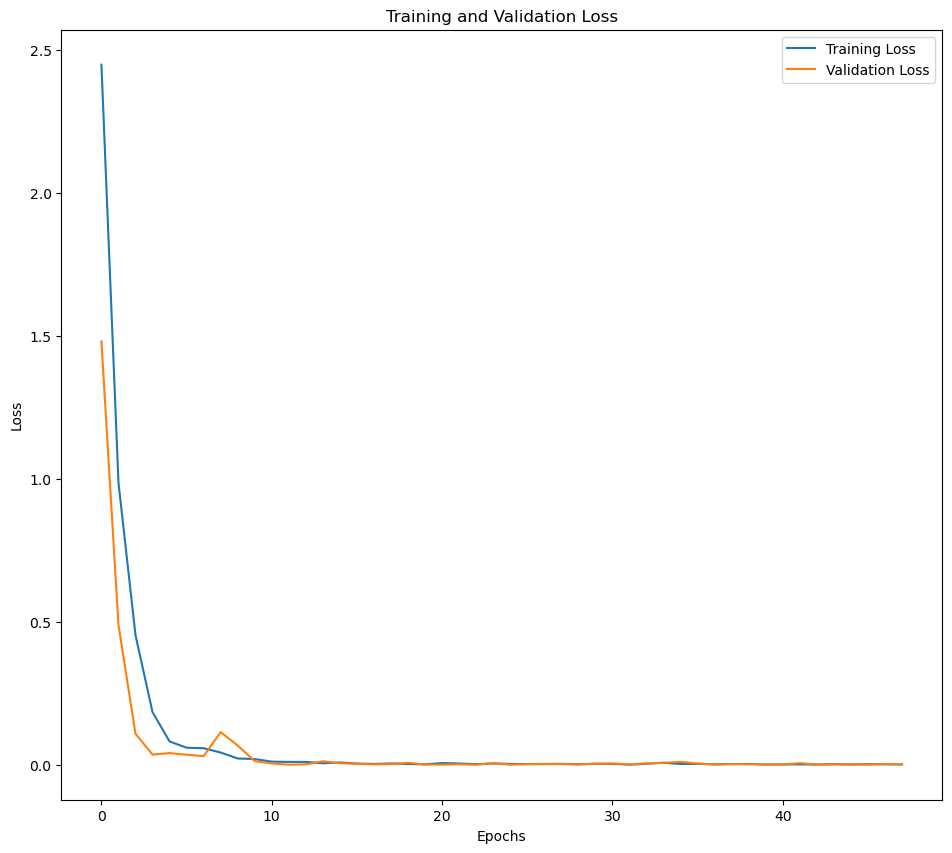

In [239]:
X = np.arange(0,48,1)
plt.figure(1, figsize = (25, 10))
plt.subplot(1,2,1)
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Training and Validation Loss")
plt.plot(X, history.history["loss"], label = "Training Loss")
plt.plot(X, history.history["val_loss"], label = "Validation Loss")
plt.legend()

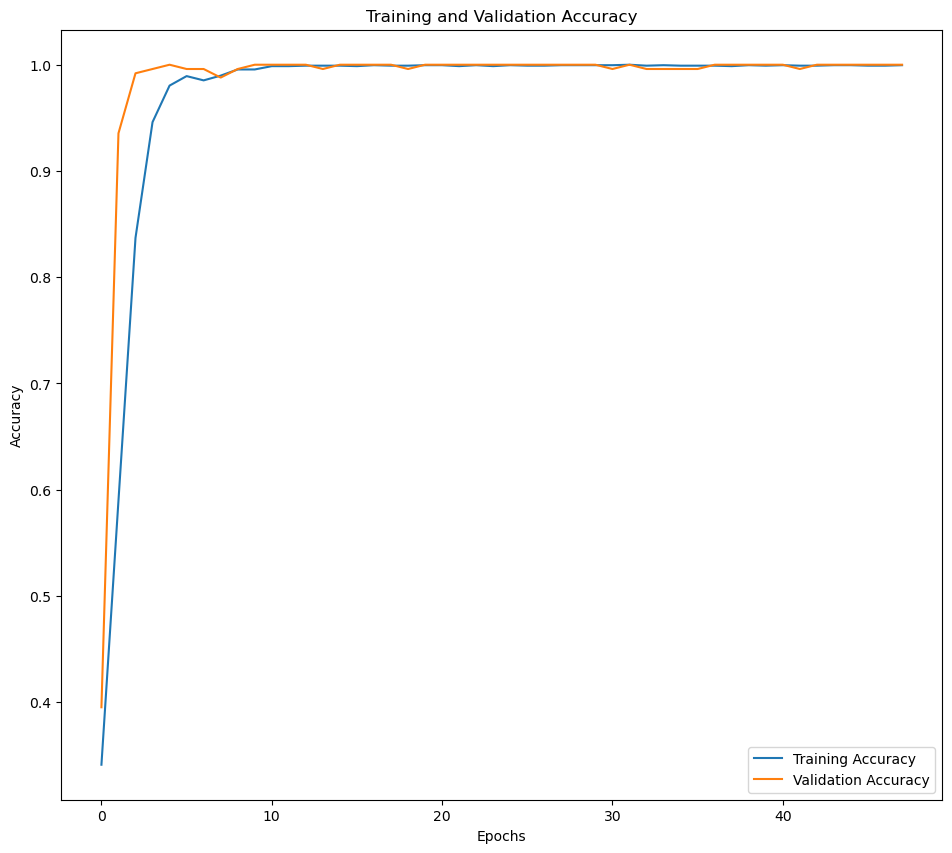

In [240]:
plt.figure(1, figsize = (25, 10))
plt.subplot(1,2,2)
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.title("Training and Validation Accuracy")
plt.plot(X, history.history["accuracy"], label = "Training Accuracy")
plt.plot(X, history.history["val_accuracy"], label = "Validation Accuracy")

plt.legend()

##### Change the optimizer function

In [51]:
from tensorflow.keras.callbacks import ModelCheckpoint,EarlyStopping
checkpoint=ModelCheckpoint(r'C:\Users\NTECH\Desktop\dataset\RAdamCNNapple2.h5',
                          monitor='val_accuracy',
                          mode='max',
                          save_best_only=True,
                          verbose=1)
earlystop=EarlyStopping(monitor='val_accuracy',
                       min_delta=0,
                       patience=25,
                       verbose=0,
                       restore_best_weights=True)

callbacks=[checkpoint,earlystop]

In [50]:
import tensorflow_addons as tfa
from tensorflow.keras.applications import VGG16
# Replace the optimizer with RAdam
radam_optimizer = tfa.optimizers.RectifiedAdam()
cnn_model.compile(loss='categorical_crossentropy', 
                  optimizer=radam_optimizer,
                  metrics=['accuracy'])

In [52]:
# Train the model
BATCH_SIZE = 64
EPOCHS = 100
with tf.device("/device:GPU:0"): #with tf.device("/device:GPU:0"):
        history = cnn_model.fit(train_x, 
                            train_y, 
                            batch_size=BATCH_SIZE, 
                            epochs=EPOCHS, 
                            validation_data=(val_x, val_y), 
                            callbacks=callbacks
                               )

Epoch 1/100
35/35 [==============================] - ETA: 0s - loss: 1.3760 - accuracy: 0.3134
Epoch 1: val_accuracy improved from -inf to 0.17339, saving model to C:\Users\NTECH\Desktop\dataset\RAdamCNNapple2.h5
35/35 [==============================] - 282s 8s/step - loss: 1.3760 - accuracy: 0.3134 - val_loss: 1.2393 - val_accuracy: 0.1734
Epoch 2/100
35/35 [==============================] - ETA: 0s - loss: 1.2153 - accuracy: 0.4491
Epoch 2: val_accuracy improved from 0.17339 to 0.80645, saving model to C:\Users\NTECH\Desktop\dataset\RAdamCNNapple2.h5
35/35 [==============================] - 233s 7s/step - loss: 1.2153 - accuracy: 0.4491 - val_loss: 0.8869 - val_accuracy: 0.8065
Epoch 3/100
35/35 [==============================] - ETA: 0s - loss: 1.0237 - accuracy: 0.5826
Epoch 3: val_accuracy improved from 0.80645 to 0.85081, saving model to C:\Users\NTECH\Desktop\dataset\RAdamCNNapple2.h5
35/35 [==============================] - 226s 6s/step - loss: 1.0237 - accuracy: 0.5826 - val_l

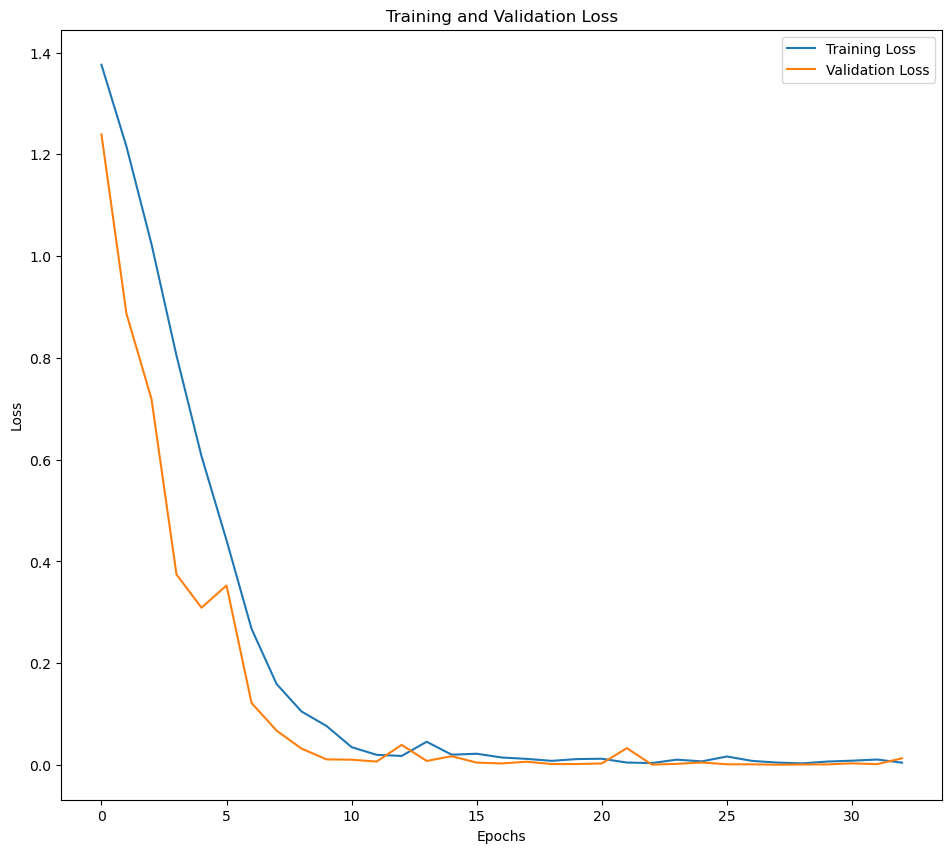

In [55]:
X = np.arange(0,33,1)
plt.figure(1, figsize = (25, 10))
plt.subplot(1,2,1)
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Training and Validation Loss")
plt.plot(X, history.history["loss"], label = "Training Loss")
plt.plot(X, history.history["val_loss"], label = "Validation Loss")
plt.legend()

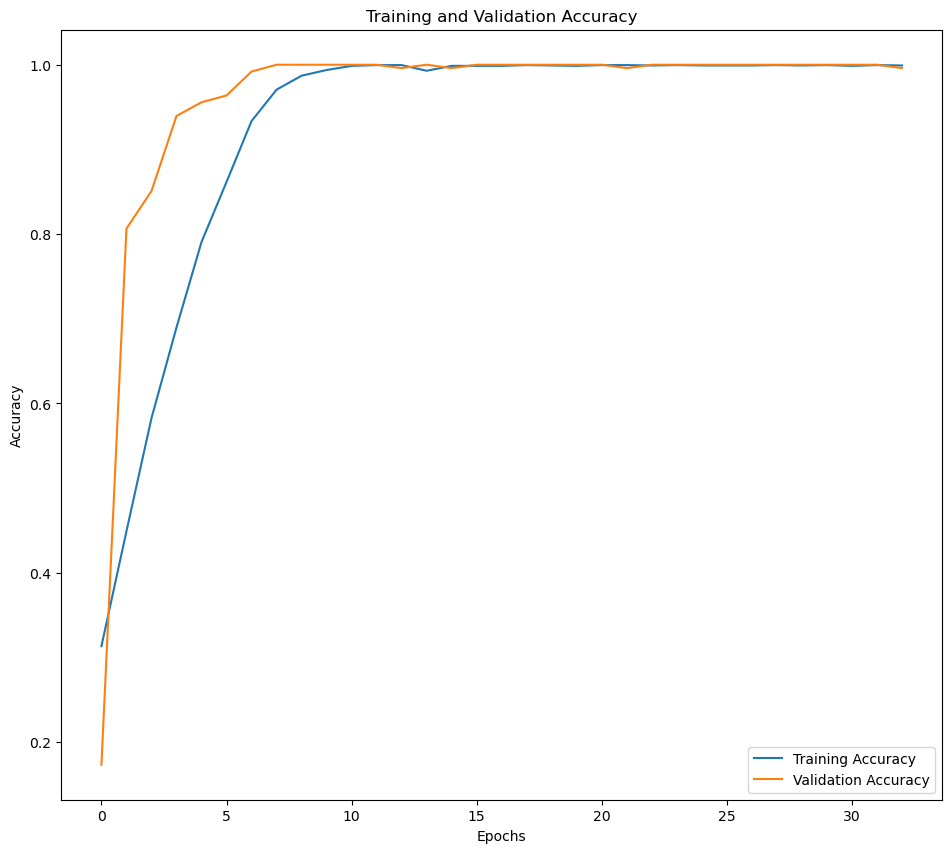

In [56]:
plt.figure(1, figsize = (25, 10))
plt.subplot(1,2,2)
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.title("Training and Validation Accuracy")
plt.plot(X, history.history["accuracy"], label = "Training Accuracy")
plt.plot(X, history.history["val_accuracy"], label = "Validation Accuracy")

plt.legend()

##### In this step we can change the learning rate[0.0001,0.0005,0.01] and change batch_size values[64, 100,138]

In [53]:
from tensorflow.keras.callbacks import ModelCheckpoint,EarlyStopping
checkpoint=ModelCheckpoint(r'C:\Users\NTECH\Desktop\dataset\0.0001CNNapple2.h5',
                          monitor='val_accuracy',
                          mode='max',
                          save_best_only=True,
                          verbose=1)
earlystop=EarlyStopping(monitor='val_accuracy',
                       min_delta=0,
                       patience=25,
                       verbose=0,
                       restore_best_weights=True)

callbacks=[checkpoint,earlystop]

In [57]:
from tensorflow.keras.optimizers import Adam
optimizer = Adam(learning_rate=0.0001)

# Compile the model with the optimizer
cnn_model.compile(optimizer=optimizer, 
                  loss='categorical_crossentropy', 
                  metrics=['accuracy'])

In [58]:
# Train the model
BATCH_SIZE = 64
EPOCHS = 100
with tf.device("/device:GPU:0"): #with tf.device("/device:GPU:0"):
        history = cnn_model.fit(train_x, 
                            train_y, 
                            batch_size=BATCH_SIZE, 
                            epochs=EPOCHS, 
                            validation_data=(val_x, val_y), 
                            callbacks=callbacks
                               )

Epoch 1/100
35/35 [==============================] - ETA: 0s - loss: 0.1097 - accuracy: 0.9879
Epoch 1: val_accuracy improved from -inf to 1.00000, saving model to C:\Users\NTECH\Desktop\dataset\0.0001CNNapple2.h5
35/35 [==============================] - 185s 5s/step - loss: 0.1097 - accuracy: 0.9879 - val_loss: 0.0300 - val_accuracy: 1.0000
Epoch 2/100
35/35 [==============================] - ETA: 0s - loss: 0.0758 - accuracy: 0.9964
Epoch 2: val_accuracy did not improve from 1.00000
35/35 [==============================] - 155s 4s/step - loss: 0.0758 - accuracy: 0.9964 - val_loss: 0.0263 - val_accuracy: 1.0000
Epoch 3/100
35/35 [==============================] - ETA: 0s - loss: 0.0519 - accuracy: 0.9991
Epoch 3: val_accuracy did not improve from 1.00000
35/35 [==============================] - 155s 4s/step - loss: 0.0519 - accuracy: 0.9991 - val_loss: 0.0160 - val_accuracy: 1.0000
Epoch 4/100
35/35 [==============================] - ETA: 0s - loss: 0.0415 - accuracy: 0.9991
Epoch 4: 

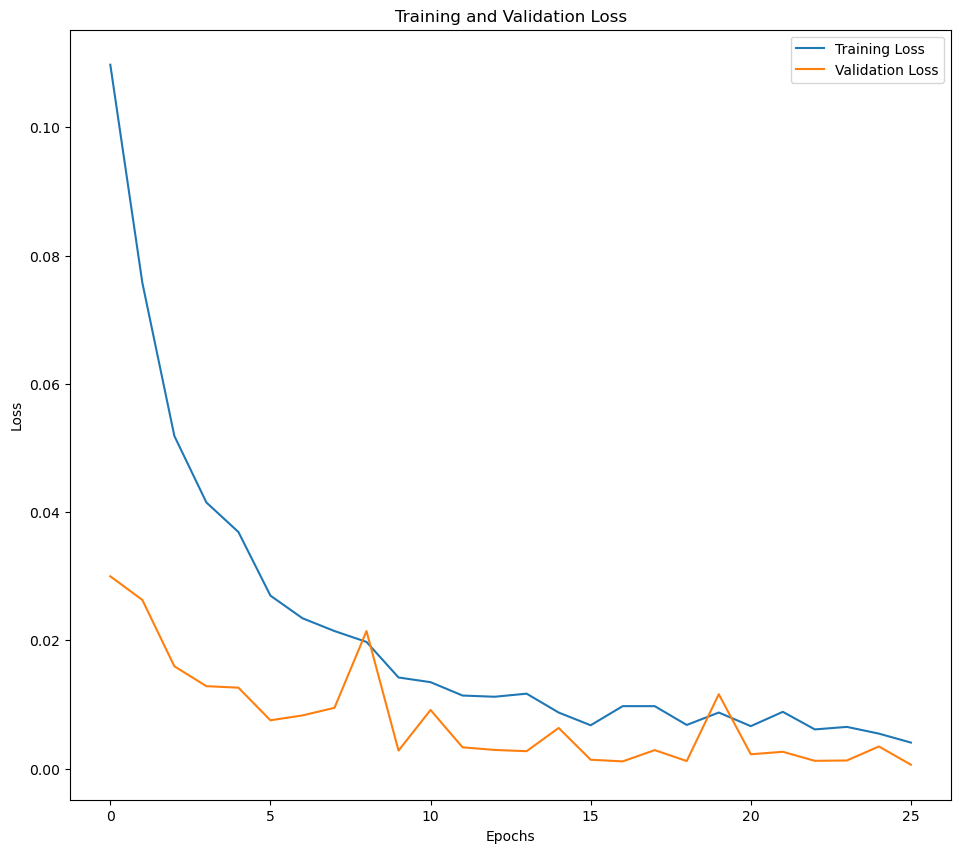

In [59]:
X = np.arange(0,26,1)
plt.figure(1, figsize = (25, 10))
plt.subplot(1,2,1)
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Training and Validation Loss")
plt.plot(X, history.history["loss"], label = "Training Loss")
plt.plot(X, history.history["val_loss"], label = "Validation Loss")
plt.legend()

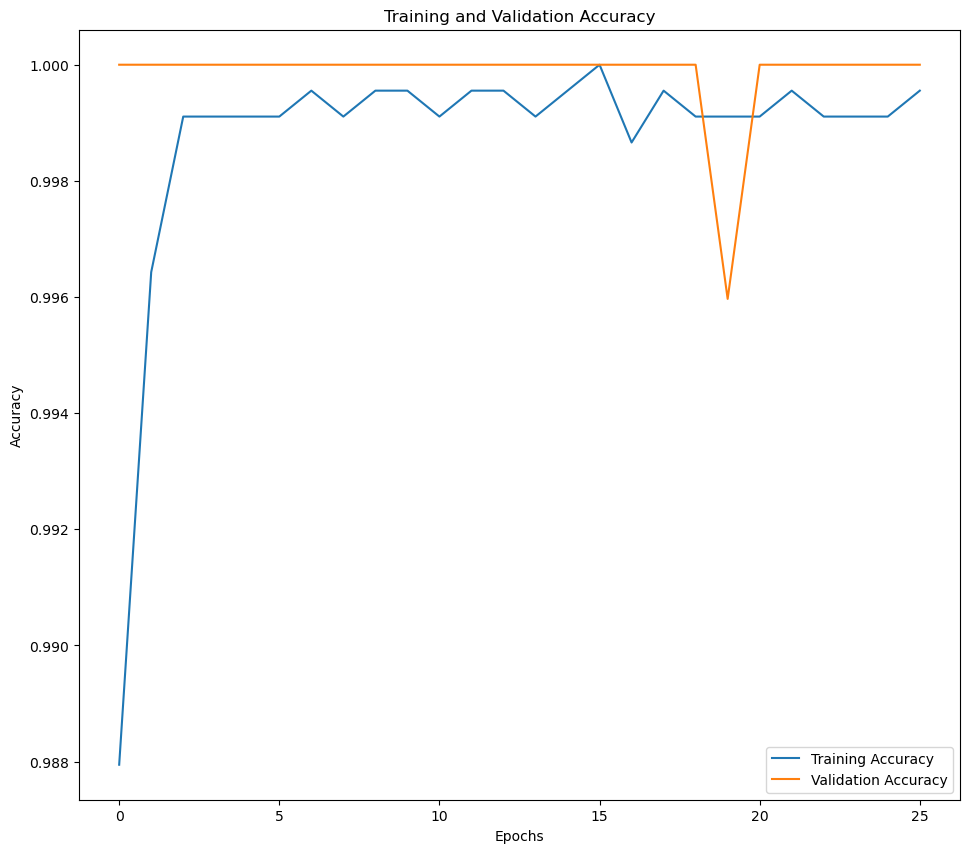

In [60]:
plt.figure(1, figsize = (25, 10))
plt.subplot(1,2,2)
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.title("Training and Validation Accuracy")
plt.plot(X, history.history["accuracy"], label = "Training Accuracy")
plt.plot(X, history.history["val_accuracy"], label = "Validation Accuracy")

plt.legend()

###### ResNet50

In [279]:
from tensorflow.keras.applications.resnet50 import ResNet50
resnet = ResNet50(input_shape=(224, 224, 3), weights='imagenet', include_top=False)


In [280]:
resnet.summary()

Model: "resnet50"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_7 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_7[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                           

In [281]:
output = resnet.layers[-1].output
output = tf.keras.layers.GlobalAveragePooling2D()(output)
resnet_model = tf.keras.models.Model(resnet.input, output)

In [282]:
for layer in resnet_model.layers:
    layer.trainable=False

In [284]:
training_bottleneck_featuresresnet50 = get_bottleneck_features(resnet_model, train_x)
validation_bottleneck_featuresresnet50 = get_bottleneck_features(resnet_model, val_x)
print("Shape of training bottleneck features = ", training_bottleneck_featuresresnet50.shape)
print("Shape of validation bottleneck features = ", validation_bottleneck_featuresresnet50.shape)

8/8 [==============================] - 28s 3s/step
Shape of training bottleneck features =  (2240, 2048)
Shape of validation bottleneck features =  (248, 2048)


In [285]:
resnet_model.output_shape[1]

2048

In [286]:
from tensorflow.keras.regularizers import l2
input_shape = resnet_model.output_shape[1]

ResNet50_model = tf.keras.models.Sequential()
ResNet50_model.add(tf.keras.layers.InputLayer(input_shape = (input_shape, )))

ResNet50_model.add(tf.keras.layers.Dense(512, activation = "relu", input_dim = input_shape))
#ResNet50_model.add(tf.keras.layers.Dropout(0.2))


ResNet50_model.add(tf.keras.layers.Dense(512, activation = "relu" ))
#ResNet50_model.add(tf.keras.layers.Dropout(0.2))

ResNet50_model.add(tf.keras.layers.Dense(4, activation = "softmax"))


In [287]:
ResNet50_model.summary() 


Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_11 (Dense)            (None, 512)               1049088   
                                                                 
 dense_12 (Dense)            (None, 512)               262656    
                                                                 
 dense_13 (Dense)            (None, 4)                 2052      
                                                                 
Total params: 1,313,796
Trainable params: 1,313,796
Non-trainable params: 0
_________________________________________________________________


In [76]:
from tensorflow.keras.optimizers import Adagrad
ResNet50_model.compile(loss='categorical_crossentropy',
                  optimizer='adam',
                  metrics=['accuracy'])
#"kullback_leibler_divergence"

In [109]:
BATCH_SIZE = 64
EPOCHS = 100
with tf.device("/device:GPU:0"): #with tf.device("/device:GPU:0"):
    history = ResNet50_model.fit(x = training_bottleneck_featuresresnet50, 
                        y = train_y,
                        validation_data = (validation_bottleneck_featuresresnet50, val_y),
                        batch_size = BATCH_SIZE, 
                        epochs= EPOCHS,
                        callbacks=callbacks
                       )

Epoch 1/100
35/35 [==============================] - ETA: 0s - loss: 0.6685 - accuracy: 0.7263
Epoch 1: val_loss did not improve from 0.27139
35/35 [==============================] - 1s 29ms/step - loss: 0.6685 - accuracy: 0.7263 - val_loss: 0.6379 - val_accuracy: 0.7863
Epoch 2/100
34/35 [============================>.] - ETA: 0s - loss: 0.6348 - accuracy: 0.7449
Epoch 2: val_loss did not improve from 0.27139
35/35 [==============================] - 1s 28ms/step - loss: 0.6365 - accuracy: 0.7446 - val_loss: 0.5601 - val_accuracy: 0.8024
Epoch 3/100
35/35 [==============================] - ETA: 0s - loss: 0.6267 - accuracy: 0.7469
Epoch 3: val_loss did not improve from 0.27139
35/35 [==============================] - 1s 28ms/step - loss: 0.6267 - accuracy: 0.7469 - val_loss: 0.6846 - val_accuracy: 0.7540
Epoch 4/100
35/35 [==============================] - ETA: 0s - loss: 0.6308 - accuracy: 0.7473
Epoch 4: val_loss did not improve from 0.27139
35/35 [==============================] - 1

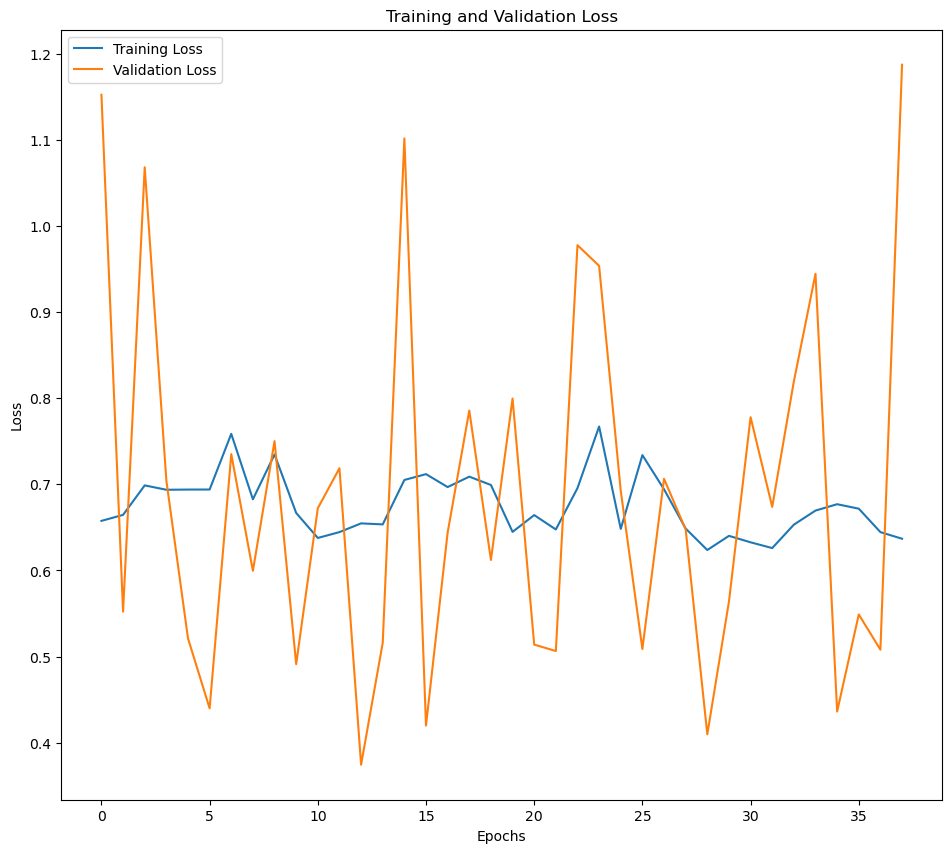

In [104]:
X = np.arange(0,38,1)
plt.figure(1, figsize = (25, 10))
plt.subplot(1,2,1)
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Training and Validation Loss")
plt.plot(X, history.history["loss"], label = "Training Loss")
plt.plot(X, history.history["val_loss"], label = "Validation Loss")
plt.legend()

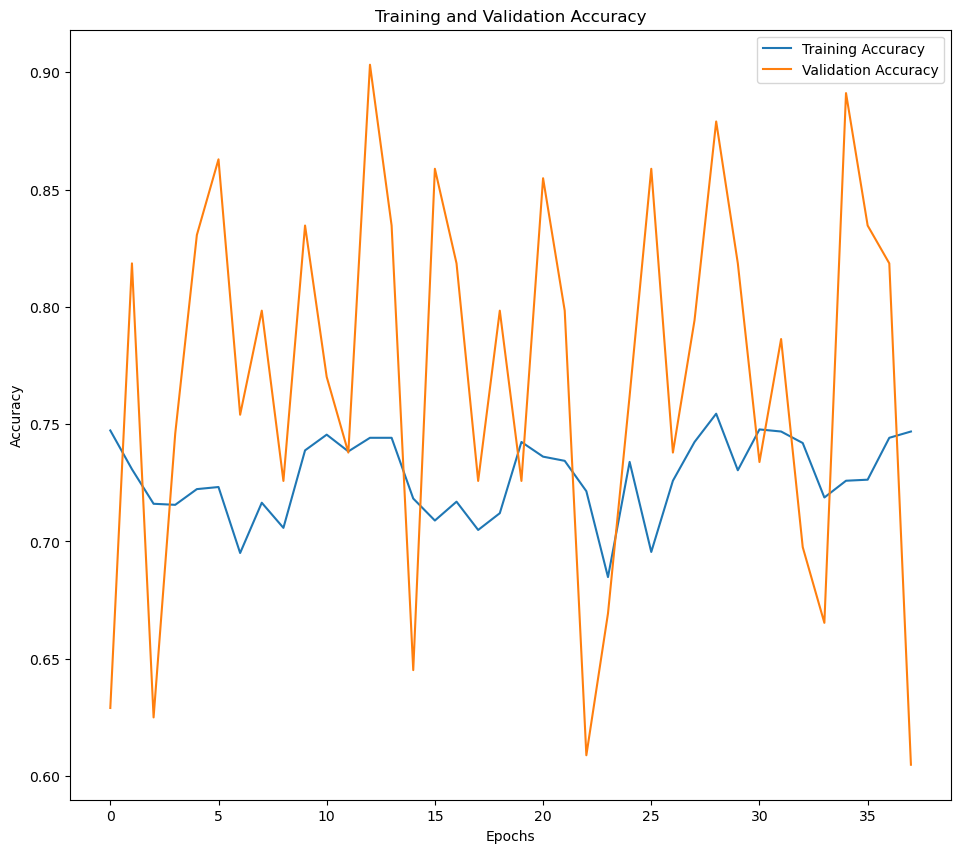

In [105]:
plt.figure(1, figsize = (25, 10))
plt.subplot(1,2,2)
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.title("Training and Validation Accuracy")
plt.plot(X, history.history["accuracy"], label = "Training Accuracy")
plt.plot(X, history.history["val_accuracy"], label = "Validation Accuracy")

plt.legend()

##### Change the Optimizer function

In [112]:
from tensorflow.keras.callbacks import ModelCheckpoint,EarlyStopping
checkpoint=ModelCheckpoint(r'C:\Users\NTECH\Desktop\dataset\resnet50apple2.h5',
                          monitor='val_accuracy',
                          mode='max',
                          save_best_only=True,
                          verbose=1)
earlystop=EarlyStopping(monitor='val_accuracy',
                       min_delta=0,
                       patience=25,
                       verbose=0,
                       restore_best_weights=True)

callbacks=[checkpoint,earlystop]

In [120]:
import tensorflow as tf
import tensorflow_addons as tfa
# Replace the optimizer with RAdam
radam_optimizer = tfa.optimizers.RectifiedAdam()
ResNet50_model.compile(loss='categorical_crossentropy', 
                  optimizer=radam_optimizer,
                  metrics=['accuracy'])


In [163]:
BATCH_SIZE = 64
EPOCHS = 100
with tf.device("/device:GPU:0"): #with tf.device("/device:GPU:0"):
    history = ResNet50_model.fit(x = training_bottleneck_featuresresnet50, 
                        y = train_y,
                        validation_data = (validation_bottleneck_featuresresnet50, val_y),
                        batch_size = BATCH_SIZE, 
                        epochs= EPOCHS,
                        callbacks=callbacks
                       )

Epoch 1/100
22/23 [===========================>..] - ETA: 0s - loss: 0.7894 - accuracy: 0.6691
Epoch 1: val_accuracy did not improve from 0.86290
23/23 [==============================] - 1s 65ms/step - loss: 0.7901 - accuracy: 0.6679 - val_loss: 0.6403 - val_accuracy: 0.8024
Epoch 2/100
23/23 [==============================] - ETA: 0s - loss: 0.7798 - accuracy: 0.6768
Epoch 2: val_accuracy did not improve from 0.86290
23/23 [==============================] - 2s 70ms/step - loss: 0.7798 - accuracy: 0.6768 - val_loss: 0.7900 - val_accuracy: 0.7540
Epoch 3/100
22/23 [===========================>..] - ETA: 0s - loss: 0.7518 - accuracy: 0.6959
Epoch 3: val_accuracy did not improve from 0.86290
23/23 [==============================] - 1s 55ms/step - loss: 0.7506 - accuracy: 0.6964 - val_loss: 0.5953 - val_accuracy: 0.7742
Epoch 4/100
22/23 [===========================>..] - ETA: 0s - loss: 0.7774 - accuracy: 0.6732
Epoch 4: val_accuracy did not improve from 0.86290
23/23 [===================

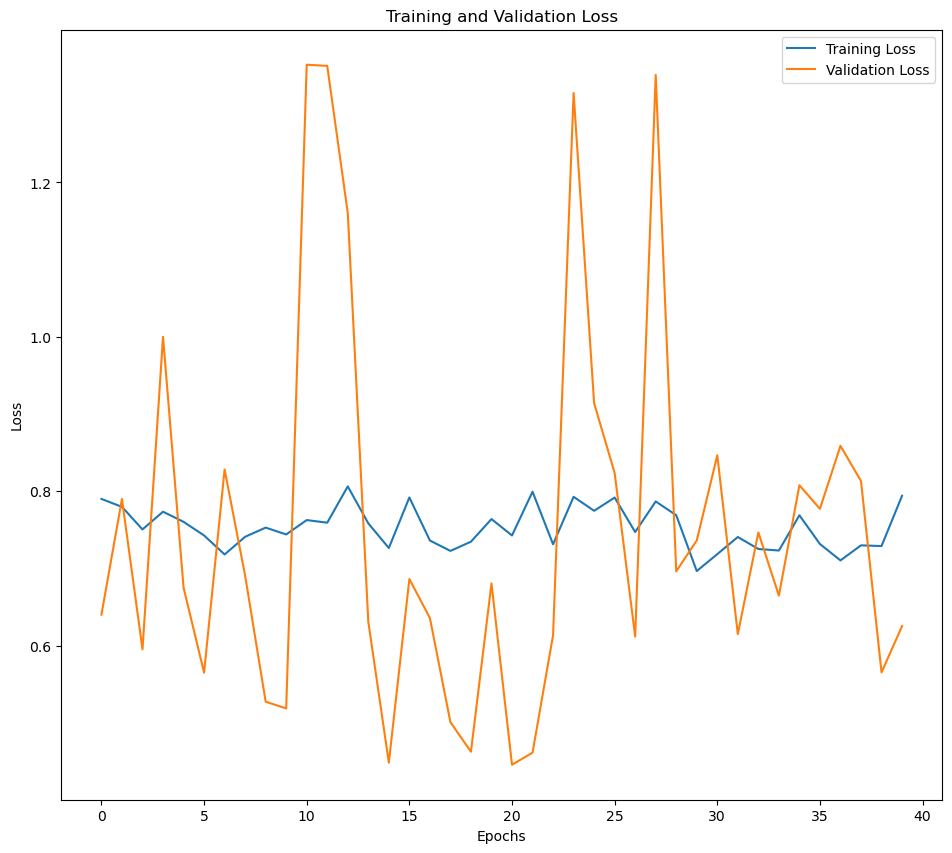

In [164]:
X = np.arange(0,40,1)
plt.figure(1, figsize = (25, 10))
plt.subplot(1,2,1)
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Training and Validation Loss")
plt.plot(X, history.history["loss"], label = "Training Loss")
plt.plot(X, history.history["val_loss"], label = "Validation Loss")
plt.legend()

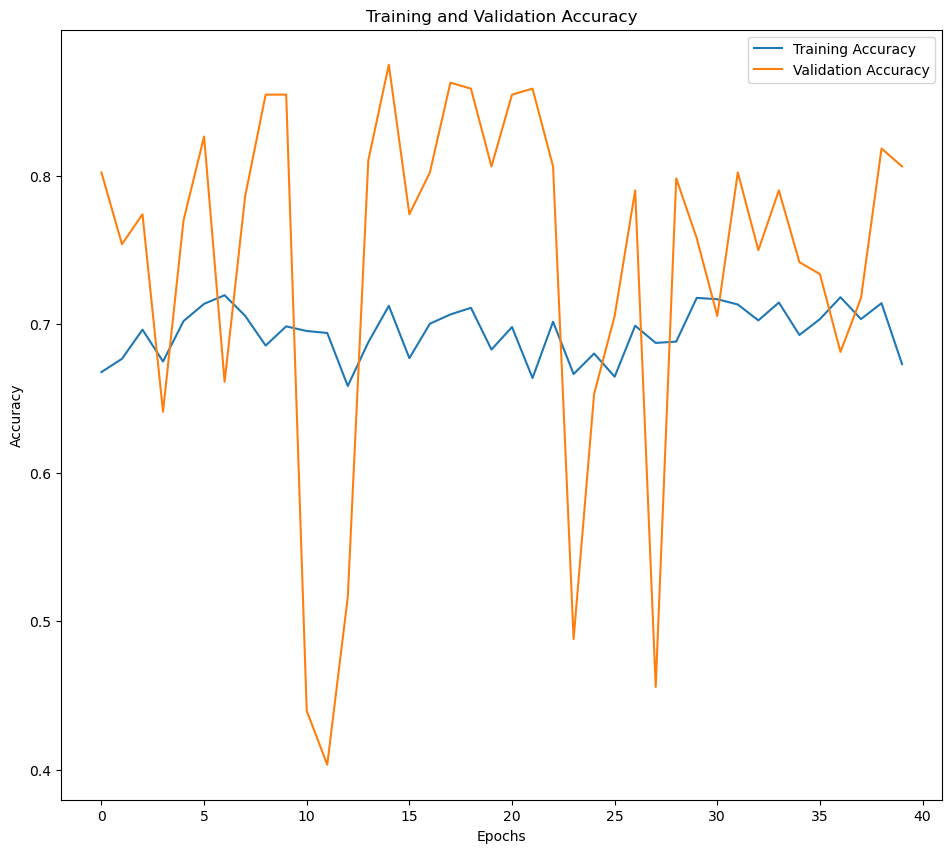

In [165]:
plt.figure(1, figsize = (25, 10))
plt.subplot(1,2,2)
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.title("Training and Validation Accuracy")
plt.plot(X, history.history["accuracy"], label = "Training Accuracy")
plt.plot(X, history.history["val_accuracy"], label = "Validation Accuracy")

plt.legend()

##### In this step we can change the learning rate[0.0001,0.0005,0.01] and change batch_size values[64, 100,138]

In [166]:
from tensorflow.keras.callbacks import ModelCheckpoint,EarlyStopping
checkpoint=ModelCheckpoint(r'C:\Users\NTECH\Desktop\dataset\0.0001resnet50apple2.h5',
                          monitor='val_accuracy',
                          mode='max',
                          save_best_only=True,
                          verbose=1)
earlystop=EarlyStopping(monitor='val_accuracy',
                       min_delta=0,
                       patience=25,
                       verbose=0,
                       restore_best_weights=True)

callbacks=[checkpoint,earlystop]

In [167]:
from tensorflow.keras.optimizers import Adam
optimizer = Adam(learning_rate=0.0001)

# Compile the model with the optimizer
ResNet50_model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

In [175]:
BATCH_SIZE = 64
EPOCHS = 100
with tf.device("/device:GPU:0"): #with tf.device("/device:GPU:0"):
    history = ResNet50_model.fit(x = training_bottleneck_featuresresnet50, 
                        y = train_y,
                        validation_data = (validation_bottleneck_featuresresnet50, val_y),
                        batch_size = BATCH_SIZE, 
                        epochs= EPOCHS, 
                        verbose = 1,
                        callbacks=callbacks
                       )

Epoch 1/100
35/35 [==============================] - ETA: 0s - loss: 0.6512 - accuracy: 0.7473
Epoch 1: val_accuracy did not improve from 0.85887
35/35 [==============================] - 2s 50ms/step - loss: 0.6512 - accuracy: 0.7473 - val_loss: 0.6762 - val_accuracy: 0.7823
Epoch 2/100
34/35 [============================>.] - ETA: 0s - loss: 0.6565 - accuracy: 0.7408
Epoch 2: val_accuracy did not improve from 0.85887
35/35 [==============================] - 2s 49ms/step - loss: 0.6543 - accuracy: 0.7406 - val_loss: 0.6189 - val_accuracy: 0.8185
Epoch 3/100
35/35 [==============================] - ETA: 0s - loss: 0.6387 - accuracy: 0.7482
Epoch 3: val_accuracy did not improve from 0.85887
35/35 [==============================] - 2s 48ms/step - loss: 0.6387 - accuracy: 0.7482 - val_loss: 0.5132 - val_accuracy: 0.8387
Epoch 4/100
35/35 [==============================] - ETA: 0s - loss: 0.6398 - accuracy: 0.7429
Epoch 4: val_accuracy did not improve from 0.85887
35/35 [===================

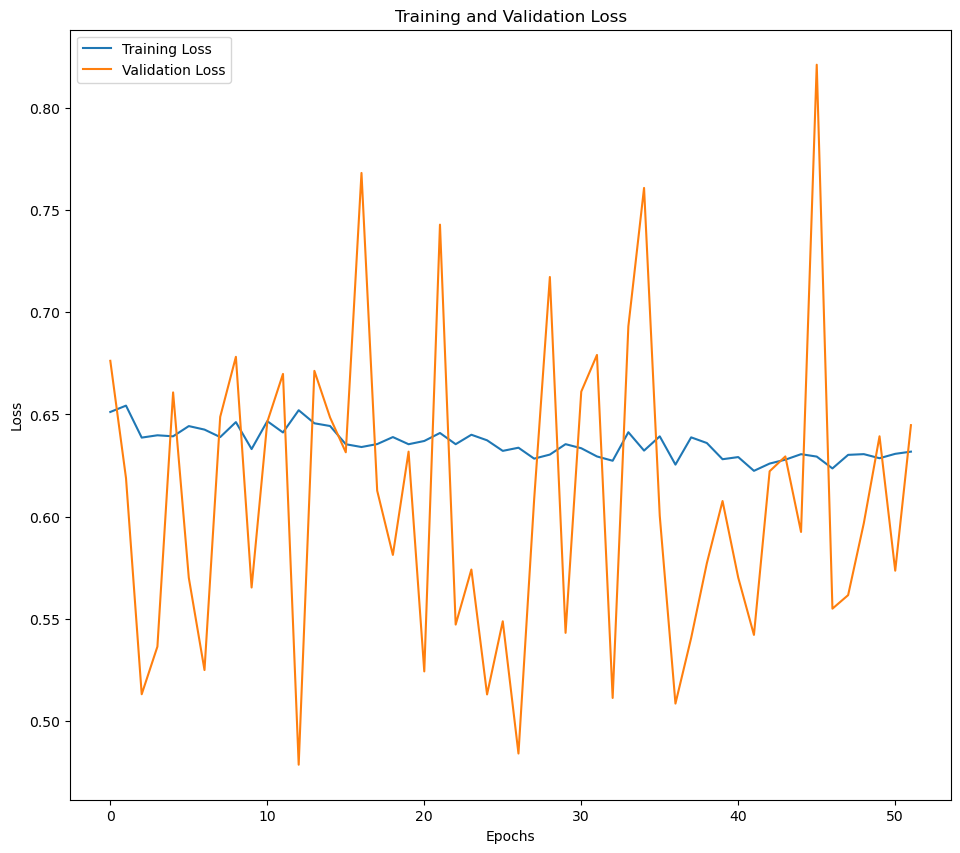

In [176]:
X = np.arange(0,52,1)
plt.figure(1, figsize = (25, 10))
plt.subplot(1,2,1)
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Training and Validation Loss")
plt.plot(X, history.history["loss"], label = "Training Loss")
plt.plot(X, history.history["val_loss"], label = "Validation Loss")
plt.legend()

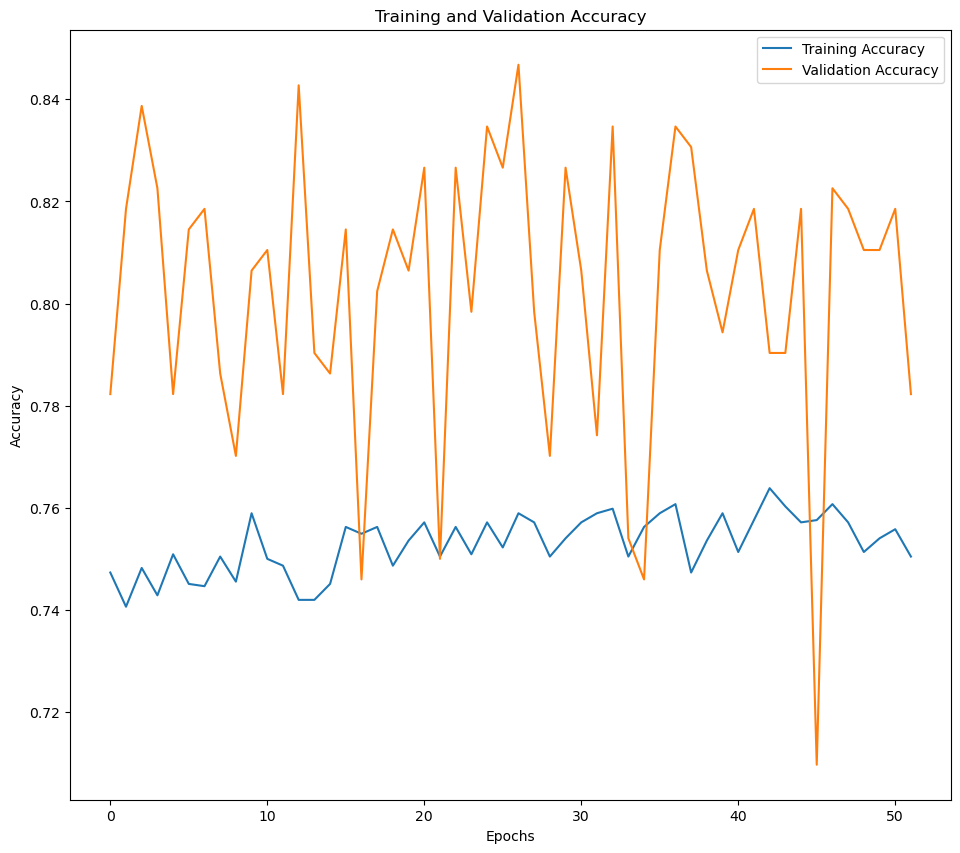

In [177]:
plt.figure(1, figsize = (25, 10))
plt.subplot(1,2,2)
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.title("Training and Validation Accuracy")
plt.plot(X, history.history["accuracy"], label = "Training Accuracy")
plt.plot(X, history.history["val_accuracy"], label = "Validation Accuracy")

plt.legend()

###### ResNet101 Model

In [39]:
from keras.applications.resnet import ResNet101
# Load the pre-trained ResNet-101 model
resnet101 = ResNet101(weights='imagenet', include_top=False)
resnet101.summary()

Model: "resnet101"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, None, None,  0           []                               
                                 3)]                                                              
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, None, None,   0           ['input_1[0][0]']                
                                3)                                                                
                                                                                                  
 conv1_conv (Conv2D)            (None, None, None,   9472        ['conv1_pad[0][0]']              
                                64)                                                       

In [40]:
output = resnet101.layers[-1].output
output = tf.keras.layers.GlobalAveragePooling2D()(output)
resnet101_model = tf.keras.models.Model(resnet101.input, output)

In [41]:
for layer in resnet101_model.layers:
    layer.trainable=False

In [44]:
training_bottleneck_features = get_bottleneck_features(resnet101_model, train_x)
validation_bottleneck_features = get_bottleneck_features(resnet101_model, val_x)
print("Shape of training bottleneck features = ", training_bottleneck_features.shape)
print("Shape of validation bottleneck features = ", validation_bottleneck_features.shape)

8/8 [==============================] - 94s 11s/step
Shape of training bottleneck features =  (2240, 2048)
Shape of validation bottleneck features =  (248, 2048)


In [45]:
from tensorflow.keras.regularizers import l2
input_shape = resnet101_model.output_shape[1]

ResNet101_model = tf.keras.models.Sequential()
ResNet101_model.add(tf.keras.layers.InputLayer(input_shape = (input_shape, )))

ResNet101_model.add(tf.keras.layers.Dense(512, activation = "relu", input_dim = input_shape))
ResNet101_model.add(tf.keras.layers.Dropout(0.2))


ResNet101_model.add(tf.keras.layers.Dense(512, activation = "relu"))
#ResNet101_model.add(tf.keras.layers.Dropout(0.2))
#VGG_model.add(tf.keras.layers.BatchNormalization())

          
ResNet101_model.add(tf.keras.layers.Dense(4, activation = "softmax"))

ResNet101_model.summary() 

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 512)               1049088   
                                                                 
 dropout (Dropout)           (None, 512)               0         
                                                                 
 dense_1 (Dense)             (None, 512)               262656    
                                                                 
 dense_2 (Dense)             (None, 4)                 2052      
                                                                 
Total params: 1,313,796
Trainable params: 1,313,796
Non-trainable params: 0
_________________________________________________________________


In [276]:

# Compile the model
ResNet101_model.compile(optimizer='adam', 
                        loss="categorical_crossentropy", 
                        metrics=['accuracy'])

In [ ]:
BATCH_SIZE = 64
EPOCHS = 100
with tf.device("/device:GPU:0"): #with tf.device("/device:GPU:0"):
    history = ResNet101_model.fit(x = training_bottleneck_features, 
                        y = train_y,
                        validation_data = (validation_bottleneck_features, val_y),
                        batch_size = BATCH_SIZE, 
                        epochs= 100,
                         
                        callbacks=callbacks
                       )

Epoch 1/100
69/70 [============================>.] - ETA: 0s - loss: 1.1350 - accuracy: 0.4642
Epoch 1: val_loss did not improve from 0.00040
70/70 [==============================] - 2s 26ms/step - loss: 1.1346 - accuracy: 0.4647 - val_loss: 0.9922 - val_accuracy: 0.6573
Epoch 2/100
70/70 [==============================] - ETA: 0s - loss: 1.1036 - accuracy: 0.4853
Epoch 2: val_loss did not improve from 0.00040
70/70 [==============================] - 2s 26ms/step - loss: 1.1036 - accuracy: 0.4853 - val_loss: 0.8172 - val_accuracy: 0.7581
Epoch 3/100
69/70 [============================>.] - ETA: 0s - loss: 1.1020 - accuracy: 0.4751
Epoch 3: val_loss did not improve from 0.00040
70/70 [==============================] - 2s 25ms/step - loss: 1.1014 - accuracy: 0.4754 - val_loss: 0.9319 - val_accuracy: 0.6734
Epoch 4/100
69/70 [============================>.] - ETA: 0s - loss: 1.1483 - accuracy: 0.4370
Epoch 4: val_loss did not improve from 0.00040
70/70 [==============================] - 2

In [ ]:
X = np.arange(0,100,1)
plt.figure(1, figsize = (25, 10))
plt.subplot(1,2,1)
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Training and Validation Loss")
plt.plot(X, history.history["loss"], label = "Training Loss")
plt.plot(X, history.history["val_loss"], label = "Validation Loss")
plt.legend()

In [ ]:
plt.figure(1, figsize = (25, 10))
plt.subplot(1,2,2)
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.title("Training and Validation Accuracy")
plt.plot(X, history.history["accuracy"], label = "Training Accuracy")
plt.plot(X, history.history["val_accuracy"], label = "Validation Accuracy")

plt.legend()

##### change the optimizer function

In [51]:
!pip install tensorflow-addons

Defaulting to user installation because normal site-packages is not writeable


In [52]:
from tensorflow.keras.callbacks import ModelCheckpoint,EarlyStopping
checkpoint=ModelCheckpoint(r'C:\Users\NTECH\Desktop\dataset\resnet101RAdamapple2.h5',
                          monitor='val_accuracy',
                          mode='max',
                          save_best_only=True,
                          verbose=1)
earlystop=EarlyStopping(monitor='val_accuracy',
                       min_delta=0,
                       patience=25,
                       verbose=0,
                       restore_best_weights=True)

callbacks=[checkpoint,earlystop]

In [53]:
import tensorflow as tf
import tensorflow_addons as tfa
# Replace the optimizer with RAdam
radam_optimizer = tfa.optimizers.RectifiedAdam()
ResNet101_model.compile(loss='categorical_crossentropy', 
                  optimizer=radam_optimizer,
                  metrics=['accuracy'])

C:\Users\NTECH\AppData\Roaming\Python\Python310\site-packages\tensorflow_addons\utils\tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(


In [60]:
BATCH_SIZE = 64
EPOCHS = 100
with tf.device("/device:GPU:0"): 
    history = ResNet101_model.fit(x = training_bottleneck_features, 
                        y = train_y,
                        validation_data = (validation_bottleneck_features, val_y),
                        batch_size = BATCH_SIZE, 
                        epochs= EPOCHS,
                        callbacks=callbacks
                       )

Epoch 1/100
35/35 [==============================] - ETA: 0s - loss: 1.2638 - accuracy: 0.3964
Epoch 1: val_accuracy did not improve from 0.78629
35/35 [==============================] - 2s 50ms/step - loss: 1.2638 - accuracy: 0.3964 - val_loss: 1.4071 - val_accuracy: 0.4637
Epoch 2/100
34/35 [============================>.] - ETA: 0s - loss: 1.2687 - accuracy: 0.3911
Epoch 2: val_accuracy did not improve from 0.78629
35/35 [==============================] - 2s 47ms/step - loss: 1.2670 - accuracy: 0.3938 - val_loss: 1.2948 - val_accuracy: 0.5968
Epoch 3/100
35/35 [==============================] - ETA: 0s - loss: 1.2538 - accuracy: 0.4009
Epoch 3: val_accuracy did not improve from 0.78629
35/35 [==============================] - 2s 45ms/step - loss: 1.2538 - accuracy: 0.4009 - val_loss: 1.4231 - val_accuracy: 0.5363
Epoch 4/100
34/35 [============================>.] - ETA: 0s - loss: 1.2534 - accuracy: 0.4003
Epoch 4: val_accuracy did not improve from 0.78629
35/35 [===================

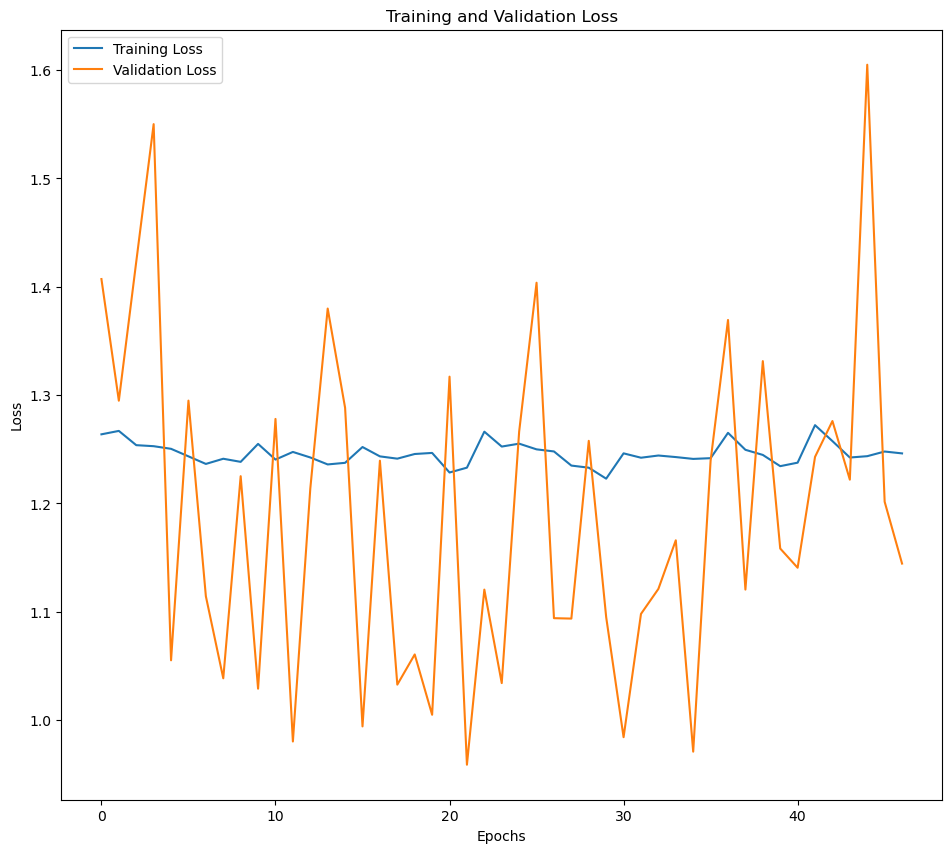

In [61]:
X = np.arange(0,47,1)
plt.figure(1, figsize = (25, 10))
plt.subplot(1,2,1)
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Training and Validation Loss")
plt.plot(X, history.history["loss"], label = "Training Loss")
plt.plot(X, history.history["val_loss"], label = "Validation Loss")
plt.legend()

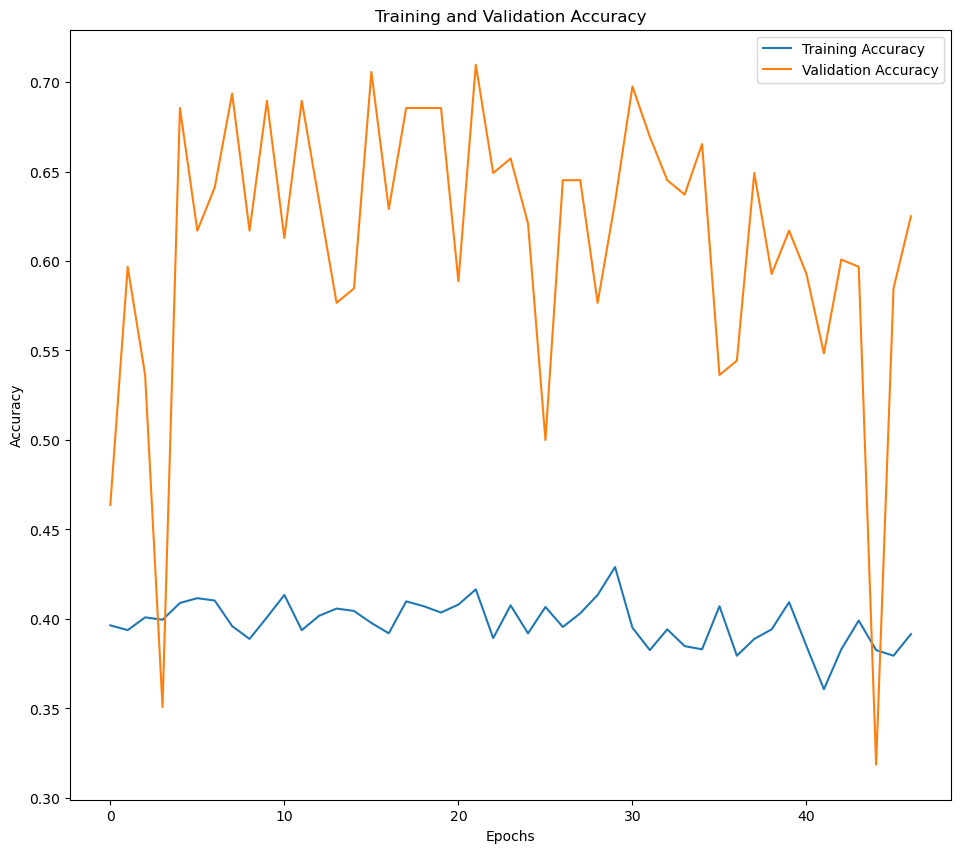

In [62]:
plt.figure(1, figsize = (25, 10))
plt.subplot(1,2,2)
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.title("Training and Validation Accuracy")
plt.plot(X, history.history["accuracy"], label = "Training Accuracy")
plt.plot(X, history.history["val_accuracy"], label = "Validation Accuracy")

plt.legend()

##### In this step we can change the learning rate[0.0001,0.0005,0.01] and change batch_size values[64, 100,138]

In [69]:
from tensorflow.keras.callbacks import ModelCheckpoint,EarlyStopping
checkpoint=ModelCheckpoint(r'C:\Users\NTECH\Desktop\dataset\0.0001resnet101apple2.h5',
                          monitor='val_accuracy',
                          mode='max',
                          save_best_only=True,
                          verbose=1)
earlystop=EarlyStopping(monitor='val_accuracy',
                       min_delta=0,
                       patience=25,
                       verbose=0,
                       restore_best_weights=True)

callbacks=[checkpoint,earlystop]

In [70]:
from tensorflow.keras.optimizers import Adam
optimizer = Adam(learning_rate=0.0001)

# Compile the model with the optimizer
ResNet101_model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

In [85]:
BATCH_SIZE = 64
EPOCHS = 100
with tf.device("/device:GPU:0"): #with tf.device("/device:GPU:0"):
    history = ResNet101_model.fit(x = training_bottleneck_features, 
                        y = train_y,
                        validation_data = (validation_bottleneck_features, val_y),
                        batch_size = BATCH_SIZE, 
                        epochs= EPOCHS,
                        callbacks=callbacks
                       )

Epoch 1/100
35/35 [==============================] - ETA: 0s - loss: 1.1469 - accuracy: 0.4692
Epoch 1: val_accuracy did not improve from 0.74597
35/35 [==============================] - 1s 40ms/step - loss: 1.1469 - accuracy: 0.4692 - val_loss: 1.1131 - val_accuracy: 0.6169
Epoch 2/100
35/35 [==============================] - ETA: 0s - loss: 1.1502 - accuracy: 0.4710
Epoch 2: val_accuracy did not improve from 0.74597
35/35 [==============================] - 1s 36ms/step - loss: 1.1502 - accuracy: 0.4710 - val_loss: 1.0078 - val_accuracy: 0.6573
Epoch 3/100
35/35 [==============================] - ETA: 0s - loss: 1.1429 - accuracy: 0.4786
Epoch 3: val_accuracy did not improve from 0.74597
35/35 [==============================] - 1s 37ms/step - loss: 1.1429 - accuracy: 0.4786 - val_loss: 0.9922 - val_accuracy: 0.6734
Epoch 4/100
35/35 [==============================] - ETA: 0s - loss: 1.1546 - accuracy: 0.4732
Epoch 4: val_accuracy did not improve from 0.74597
35/35 [===================

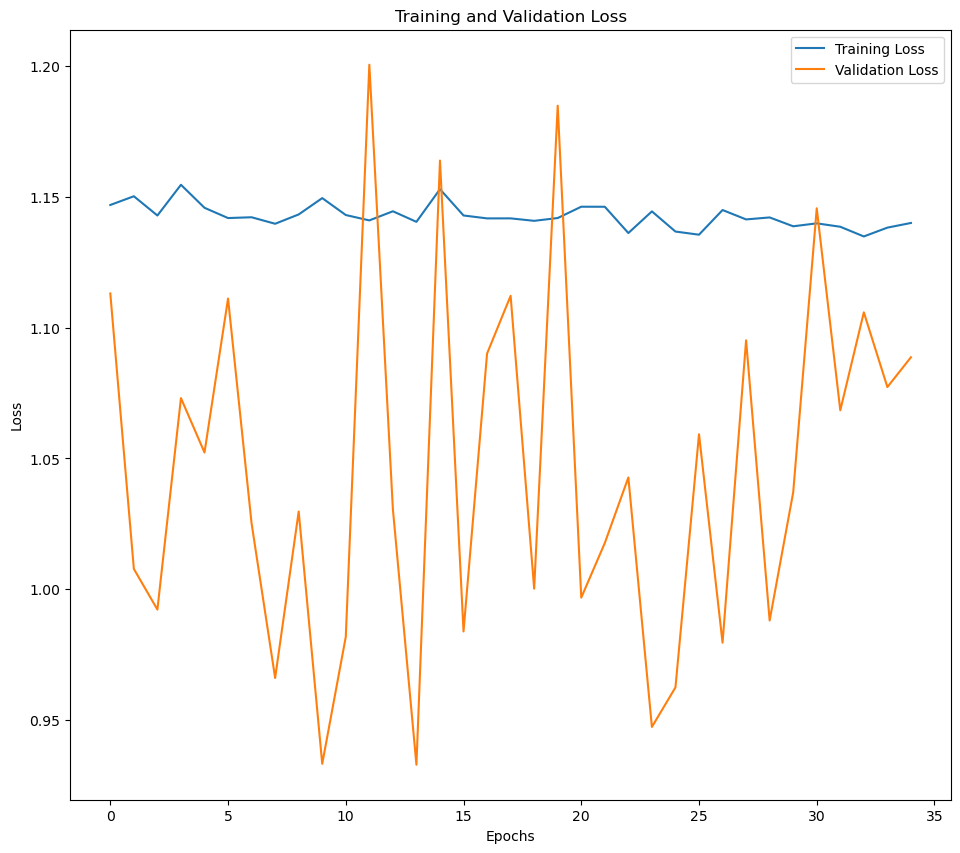

In [86]:
X = np.arange(0,35,1)
plt.figure(1, figsize = (25, 10))
plt.subplot(1,2,1)
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Training and Validation Loss")
plt.plot(X, history.history["loss"], label = "Training Loss")
plt.plot(X, history.history["val_loss"], label = "Validation Loss")
plt.legend()

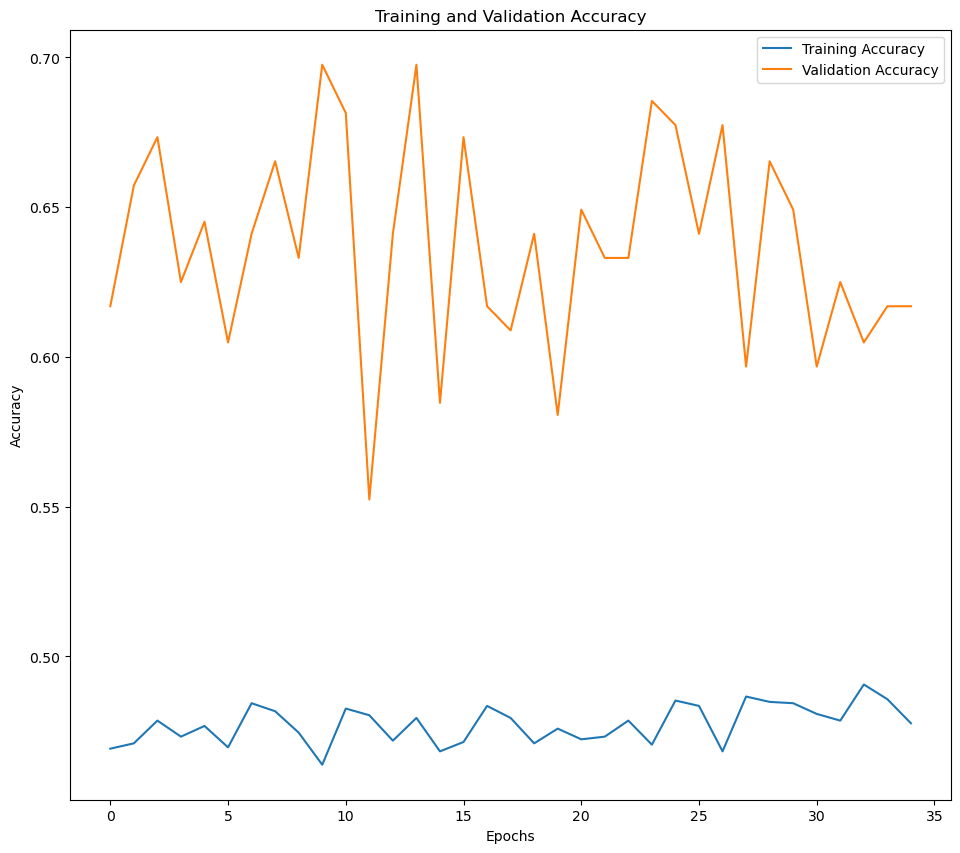

In [87]:
plt.figure(1, figsize = (25, 10))
plt.subplot(1,2,2)
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.title("Training and Validation Accuracy")
plt.plot(X, history.history["accuracy"], label = "Training Accuracy")
plt.plot(X, history.history["val_accuracy"], label = "Validation Accuracy")

plt.legend()

###### DenseNet

In [39]:
from keras.applications.densenet import DenseNet121

# Load the pre-trained DenseNet121 model
densenet = DenseNet121(include_top=False, weights='imagenet')
densenet.summary()

Model: "densenet121"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, None, None,  0           []                               
                                 3)]                                                              
                                                                                                  
 zero_padding2d (ZeroPadding2D)  (None, None, None,   0          ['input_1[0][0]']                
                                3)                                                                
                                                                                                  
 conv1/conv (Conv2D)            (None, None, None,   9408        ['zero_padding2d[0][0]']         
                                64)                                                     

In [40]:
output = densenet.layers[-1].output
output = tf.keras.layers.GlobalAveragePooling2D()(output)
densenet_model = tf.keras.models.Model(densenet.input, output)

In [41]:
for layer in densenet_model.layers:
    layer.trainable=False

In [67]:
training_bottleneck_featuresdensenet = get_bottleneck_features(densenet_model, train_x)
validation_bottleneck_featuresdensenet = get_bottleneck_features(densenet_model, val_x)
print("Shape of training bottleneck features = ", training_bottleneck_features.shape)
print("Shape of validation bottleneck features = ", validation_bottleneck_features.shape)

8/8 [==============================] - 35s 4s/step
Shape of training bottleneck features =  (2240, 2048)
Shape of validation bottleneck features =  (248, 2048)


In [71]:
input_shape = densenet_model.output_shape[1]

DenseNet_model = tf.keras.models.Sequential()
DenseNet_model.add(tf.keras.layers.InputLayer(input_shape = (input_shape, )))

DenseNet_model.add(tf.keras.layers.Dense(512, activation = "relu", input_dim = input_shape))
DenseNet_model.add(tf.keras.layers.Dropout(0.2))


DenseNet_model.add(tf.keras.layers.Dense(512, activation = "relu"))
#ResNet101_model.add(tf.keras.layers.Dropout(0.2))
#VGG_model.add(tf.keras.layers.BatchNormalization())

          
DenseNet_model.add(tf.keras.layers.Dense(4, activation = "softmax"))

DenseNet_model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_3 (Dense)             (None, 512)               524800    
                                                                 
 dropout_1 (Dropout)         (None, 512)               0         
                                                                 
 dense_4 (Dense)             (None, 512)               262656    
                                                                 
 dense_5 (Dense)             (None, 4)                 2052      
                                                                 
Total params: 789,508
Trainable params: 789,508
Non-trainable params: 0
_________________________________________________________________


In [156]:

# Compile the model
DenseNet_model.compile(optimizer='adam', 
                        loss="categorical_crossentropy", 
                        metrics=['accuracy'])

In [174]:
BATCH_SIZE = 64
EPOCHS = 100
with tf.device("/device:GPU:0"): #with tf.device("/device:GPU:0"):
    history = DenseNet_model.fit(x = training_bottleneck_features, 
                        y = train_y,
                        validation_data = (validation_bottleneck_features, val_y),
                        batch_size = BATCH_SIZE, 
                        epochs= 100,
                         
                        callbacks=callbacks
                       )

Epoch 1/100
34/35 [============================>.] - ETA: 0s - loss: 0.0266 - accuracy: 0.9908
Epoch 1: val_loss did not improve from 0.09830
35/35 [==============================] - 1s 24ms/step - loss: 0.0265 - accuracy: 0.9906 - val_loss: 0.1170 - val_accuracy: 0.9677
Epoch 2/100
34/35 [============================>.] - ETA: 0s - loss: 0.0188 - accuracy: 0.9931
Epoch 2: val_loss did not improve from 0.09830
35/35 [==============================] - 1s 20ms/step - loss: 0.0191 - accuracy: 0.9933 - val_loss: 0.1803 - val_accuracy: 0.9758
Epoch 3/100
34/35 [============================>.] - ETA: 0s - loss: 0.0196 - accuracy: 0.9936
Epoch 3: val_loss did not improve from 0.09830
35/35 [==============================] - 1s 20ms/step - loss: 0.0194 - accuracy: 0.9933 - val_loss: 0.2130 - val_accuracy: 0.9677
Epoch 4/100
34/35 [============================>.] - ETA: 0s - loss: 0.0453 - accuracy: 0.9825
Epoch 4: val_loss did not improve from 0.09830
35/35 [==============================] - 1

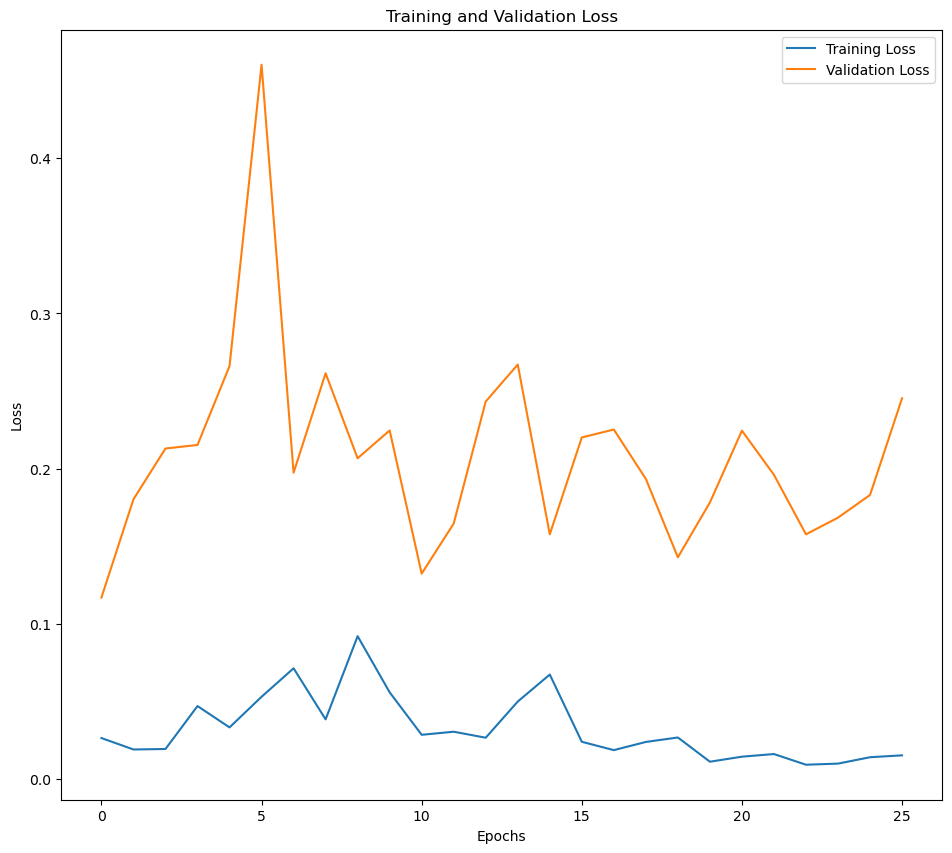

In [175]:
X = np.arange(0,26,1)
plt.figure(1, figsize = (25, 10))
plt.subplot(1,2,1)
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Training and Validation Loss")
plt.plot(X, history.history["loss"], label = "Training Loss")
plt.plot(X, history.history["val_loss"], label = "Validation Loss")
plt.legend()

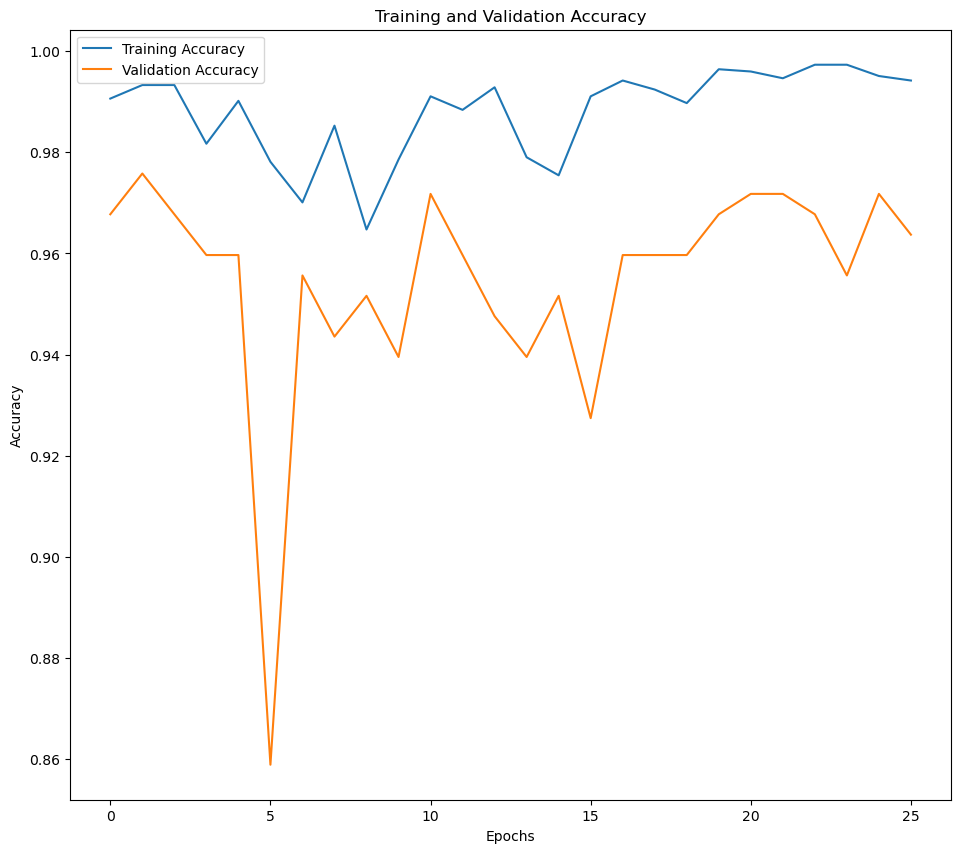

In [176]:
plt.figure(1, figsize = (25, 10))
plt.subplot(1,2,2)
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.title("Training and Validation Accuracy")
plt.plot(X, history.history["accuracy"], label = "Training Accuracy")
plt.plot(X, history.history["val_accuracy"], label = "Validation Accuracy")

plt.legend()

##### Change the optimizer function

In [139]:
!pip install tensorflow-addows

Defaulting to user installation because normal site-packages is not writeable


ERROR: Could not find a version that satisfies the requirement tensorflow-addows (from versions: none)
ERROR: No matching distribution found for tensorflow-addows


In [143]:
from tensorflow.keras.callbacks import ModelCheckpoint,EarlyStopping
checkpoint=ModelCheckpoint(r'C:\Users\NTECH\Desktop\dataset\densenetRAdamapple2.h5',
                          monitor='val_accuracy',
                           mode='max',
                           save_best_only=True,
                          verbose=1)
earlystop=EarlyStopping(monitor='val_accuracy',
                       min_delta=0,
                       patience=25,
                       verbose=0,
                       restore_best_weights=True)

callbacks=[checkpoint,earlystop]

In [144]:
import tensorflow as tf
import tensorflow_addons as tfa
from tensorflow.keras.applications import VGG16
# Replace the optimizer with RAdam
radam_optimizer = tfa.optimizers.RectifiedAdam()
DenseNet_model.compile(loss='categorical_crossentropy', 
                  optimizer=radam_optimizer,
                  metrics=['accuracy'])

In [151]:
BATCH_SIZE = 64
EPOCHS = 100
with tf.device("/device:GPU:0"): #with tf.device("/device:GPU:0"):
    history = DenseNet_model.fit(x = training_bottleneck_featuresdensenet, 
                        y = train_y,
                        validation_data = (validation_bottleneck_featuresdensenet, val_y),
                        batch_size = BATCH_SIZE, 
                        epochs= EPOCHS,
                        callbacks=callbacks
                       )

Epoch 1/100
34/35 [============================>.] - ETA: 0s - loss: 0.0099 - accuracy: 0.9963
Epoch 1: val_accuracy did not improve from 0.98387
35/35 [==============================] - 1s 35ms/step - loss: 0.0098 - accuracy: 0.9964 - val_loss: 0.2714 - val_accuracy: 0.9315
Epoch 2/100
35/35 [==============================] - ETA: 0s - loss: 0.0218 - accuracy: 0.9924
Epoch 2: val_accuracy did not improve from 0.98387
35/35 [==============================] - 1s 33ms/step - loss: 0.0218 - accuracy: 0.9924 - val_loss: 0.1854 - val_accuracy: 0.9637
Epoch 3/100
35/35 [==============================] - ETA: 0s - loss: 0.0349 - accuracy: 0.9875
Epoch 3: val_accuracy did not improve from 0.98387
35/35 [==============================] - 1s 34ms/step - loss: 0.0349 - accuracy: 0.9875 - val_loss: 0.2876 - val_accuracy: 0.9355
Epoch 4/100
35/35 [==============================] - ETA: 0s - loss: 0.0364 - accuracy: 0.9866
Epoch 4: val_accuracy did not improve from 0.98387
35/35 [===================

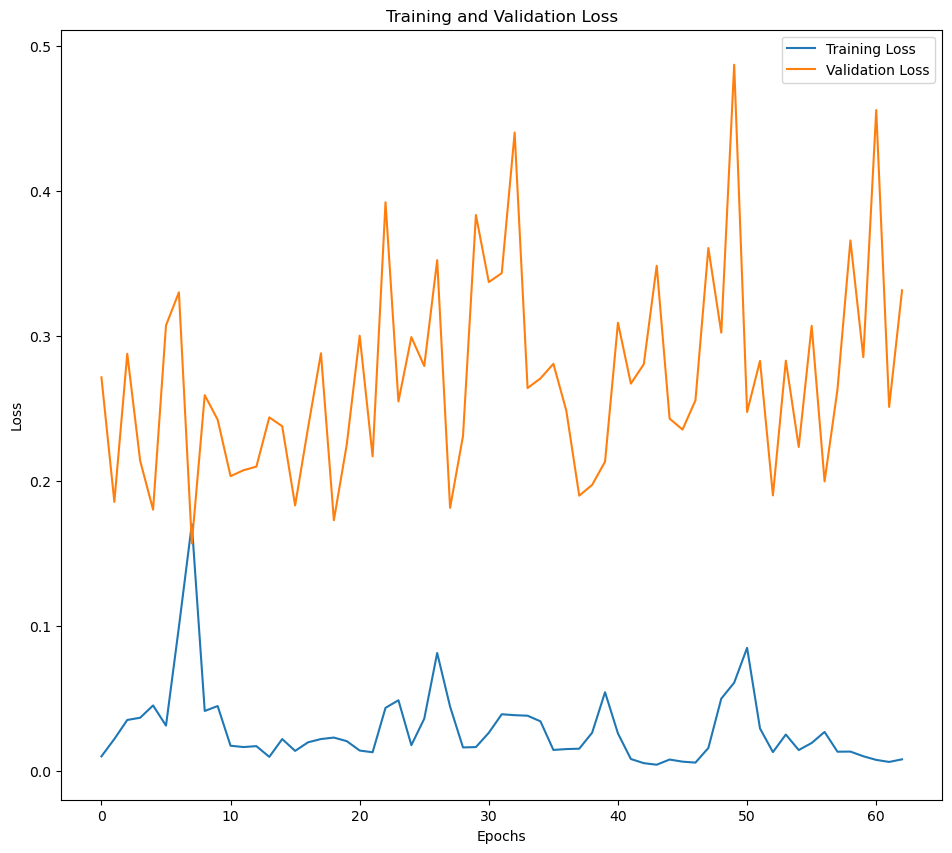

In [154]:
X = np.arange(0,63,1)
plt.figure(1, figsize = (25, 10))
plt.subplot(1,2,1)
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Training and Validation Loss")
plt.plot(X, history.history["loss"], label = "Training Loss")
plt.plot(X, history.history["val_loss"], label = "Validation Loss")
plt.legend()

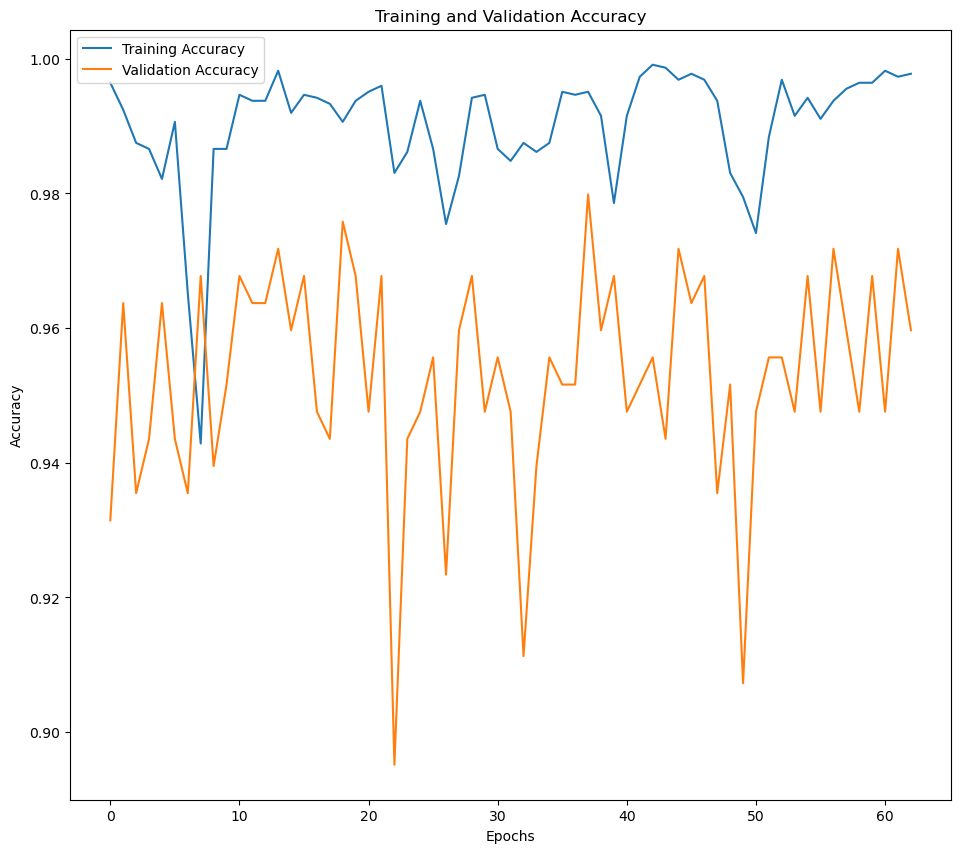

In [155]:
plt.figure(1, figsize = (25, 10))
plt.subplot(1,2,2)
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.title("Training and Validation Accuracy")
plt.plot(X, history.history["accuracy"], label = "Training Accuracy")
plt.plot(X, history.history["val_accuracy"], label = "Validation Accuracy")

plt.legend()

##### In this step we can change the learning rate[0.0001,0.0005,0.01] and change batch_size values[64, 100,138]

In [68]:
from tensorflow.keras.callbacks import ModelCheckpoint,EarlyStopping
checkpoint=ModelCheckpoint(r'C:\Users\NTECH\Desktop\dataset\0.0001densenetapple2.h5',
                          monitor='val_accuracy',
                          mode='max',
                          save_best_only=True,
                          verbose=1)
earlystop=EarlyStopping(monitor='val_accuracy',
                       min_delta=0,
                       patience=25,
                       verbose=0,
                       restore_best_weights=True)

callbacks=[checkpoint,earlystop]

In [73]:
from tensorflow.keras.optimizers import Adam
optimizer = Adam(learning_rate=0.0001)

# Compile the model with the optimizer
DenseNet_model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

In [74]:
BATCH_SIZE = 64
EPOCHS = 100
with tf.device("/device:GPU:0"): #with tf.device("/device:GPU:0"):
    history = DenseNet_model.fit(x = training_bottleneck_featuresdensenet, 
                        y = train_y,
                        validation_data = (validation_bottleneck_featuresdensenet, val_y),
                        batch_size = BATCH_SIZE, 
                        epochs= EPOCHS,
                        callbacks=callbacks
                       )

Epoch 1/100
33/35 [===========================>..] - ETA: 0s - loss: 1.1949 - accuracy: 0.4844
Epoch 1: val_accuracy improved from -inf to 0.61290, saving model to C:\Users\NTECH\Desktop\dataset\0.0001densenetapple2.h5
35/35 [==============================] - 3s 35ms/step - loss: 1.1837 - accuracy: 0.4964 - val_loss: 1.0368 - val_accuracy: 0.6129
Epoch 2/100
33/35 [===========================>..] - ETA: 0s - loss: 0.8958 - accuracy: 0.6742
Epoch 2: val_accuracy did not improve from 0.61290
35/35 [==============================] - 1s 22ms/step - loss: 0.8945 - accuracy: 0.6728 - val_loss: 1.0044 - val_accuracy: 0.6089
Epoch 3/100
34/35 [============================>.] - ETA: 0s - loss: 0.7357 - accuracy: 0.7518
Epoch 3: val_accuracy improved from 0.61290 to 0.68145, saving model to C:\Users\NTECH\Desktop\dataset\0.0001densenetapple2.h5
35/35 [==============================] - 1s 23ms/step - loss: 0.7359 - accuracy: 0.7513 - val_loss: 0.8531 - val_accuracy: 0.6815
Epoch 4/100
34/35 [====

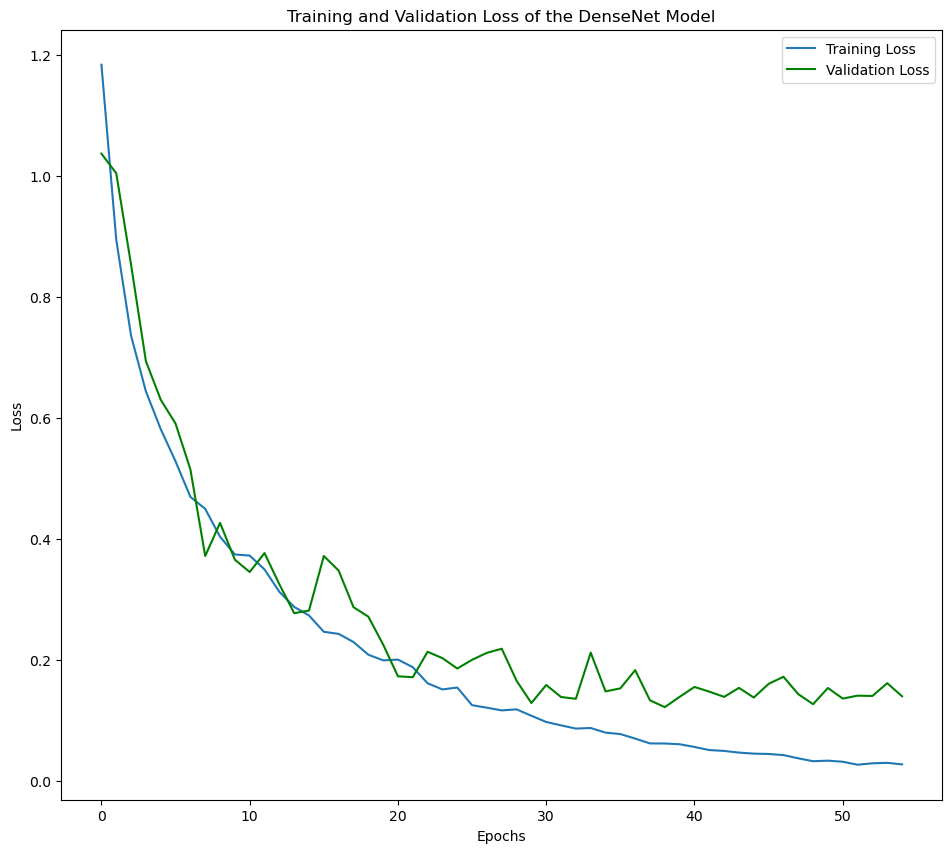

In [79]:
X = np.arange(0,55,1)
plt.figure(1, figsize = (25, 10))
plt.subplot(1,2,1)
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Training and Validation Loss of the DenseNet Model")
plt.plot(X, history.history["loss"], label = "Training Loss")
plt.plot(X, history.history["val_loss"], color='green',label = "Validation Loss")
plt.legend()

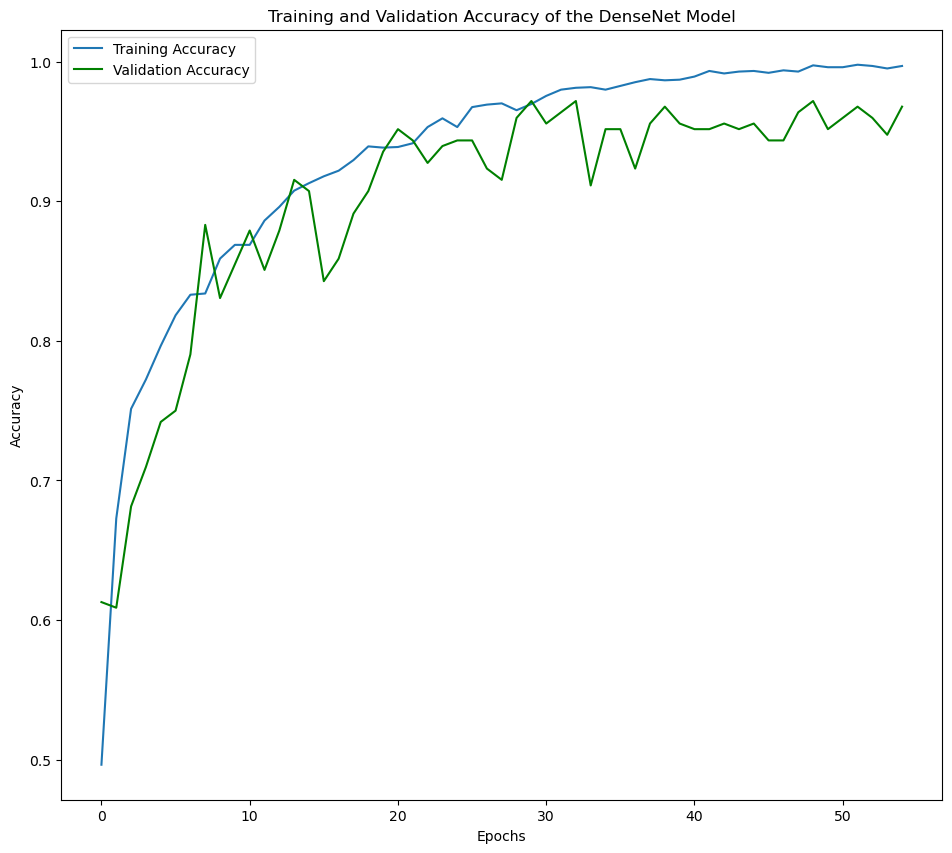

In [81]:
plt.figure(1, figsize = (25, 10))
plt.subplot(1,2,2)
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.title("Training and Validation Accuracy of the DenseNet Model")
plt.plot(X, history.history["accuracy"], label = "Training Accuracy")
plt.plot(X, history.history["val_accuracy"],color= 'green', label = "Validation Accuracy")

plt.legend()

###### InceptionV3

In [62]:
from keras.applications import InceptionV3

inceptionv3 = InceptionV3(input_shape = (224,224,3), 
                  weights='imagenet', 
                  include_top=False)
inceptionv3.summary()

Model: "inception_v3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 111, 111, 32  864         ['input_2[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 111, 111, 32  96         ['conv2d[0][0]']                 
 alization)                     )                                                      

In [63]:
output = inceptionv3.layers[-1].output
output = tf.keras.layers.GlobalAveragePooling2D()(output)
inceptionv3_model = tf.keras.models.Model(inceptionv3.input, output)

In [64]:
for layer in inceptionv3_model.layers:
    layer.trainable=False

In [86]:
training_bottleneck_features = get_bottleneck_features(inceptionv3_model, train_x)
validation_bottleneck_features = get_bottleneck_features(inceptionv3_model, val_x)
print("Shape of training bottleneck features = ", training_bottleneck_features.shape)
print("Shape of validation bottleneck features = ", validation_bottleneck_features.shape)

8/8 [==============================] - 18s 2s/step
Shape of training bottleneck features =  (2240, 2048)
Shape of validation bottleneck features =  (248, 2048)


In [87]:
from tensorflow.keras.regularizers import l2
input_shape = inceptionv3_model.output_shape[1]

Inceptionv3_model = tf.keras.models.Sequential()
Inceptionv3_model.add(tf.keras.layers.InputLayer(input_shape = (input_shape, )))

Inceptionv3_model.add(tf.keras.layers.Dense(512, activation = "relu", input_dim = input_shape))
Inceptionv3_model.add(tf.keras.layers.Dropout(0.2))


Inceptionv3_model.add(tf.keras.layers.Dense(512, activation = "relu"))
Inceptionv3_model.add(tf.keras.layers.Dropout(0.2))
#VGG_model.add(tf.keras.layers.BatchNormalization())

          
Inceptionv3_model.add(tf.keras.layers.Dense(4, activation = "softmax"))

Inceptionv3_model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_6 (Dense)             (None, 512)               1049088   
                                                                 
 dropout_2 (Dropout)         (None, 512)               0         
                                                                 
 dense_7 (Dense)             (None, 512)               262656    
                                                                 
 dropout_3 (Dropout)         (None, 512)               0         
                                                                 
 dense_8 (Dense)             (None, 4)                 2052      
                                                                 
Total params: 1,313,796
Trainable params: 1,313,796
Non-trainable params: 0
_________________________________________________________________


In [192]:
# Compile the model
Inceptionv3_model.compile(optimizer='adam', 
                        loss="categorical_crossentropy", 
                        metrics=['accuracy'])

In [193]:
BATCH_SIZE = 64
EPOCHS = 100
with tf.device("/device:GPU:0"): #with tf.device("/device:GPU:0"):
    history = Inceptionv3_model.fit(x = training_bottleneck_features, 
                        y = train_y,
                        validation_data = (validation_bottleneck_features, val_y),
                        batch_size = BATCH_SIZE, 
                        epochs= EPOCHS,
                         
                        callbacks=callbacks
                       )

Epoch 1/100
69/70 [============================>.] - ETA: 0s - loss: 1.0705 - accuracy: 0.5494
Epoch 1: val_loss did not improve from 0.09830
70/70 [==============================] - 4s 34ms/step - loss: 1.0654 - accuracy: 0.5518 - val_loss: 1.4082 - val_accuracy: 0.2782
Epoch 2/100
70/70 [==============================] - ETA: 0s - loss: 0.6826 - accuracy: 0.7254
Epoch 2: val_loss did not improve from 0.09830
70/70 [==============================] - 2s 27ms/step - loss: 0.6826 - accuracy: 0.7254 - val_loss: 1.0615 - val_accuracy: 0.5161
Epoch 3/100
68/70 [============================>.] - ETA: 0s - loss: 0.5814 - accuracy: 0.7707
Epoch 3: val_loss did not improve from 0.09830
70/70 [==============================] - 2s 25ms/step - loss: 0.5806 - accuracy: 0.7714 - val_loss: 0.7781 - val_accuracy: 0.6774
Epoch 4/100
69/70 [============================>.] - ETA: 0s - loss: 0.4596 - accuracy: 0.8320
Epoch 4: val_loss did not improve from 0.09830
70/70 [==============================] - 2

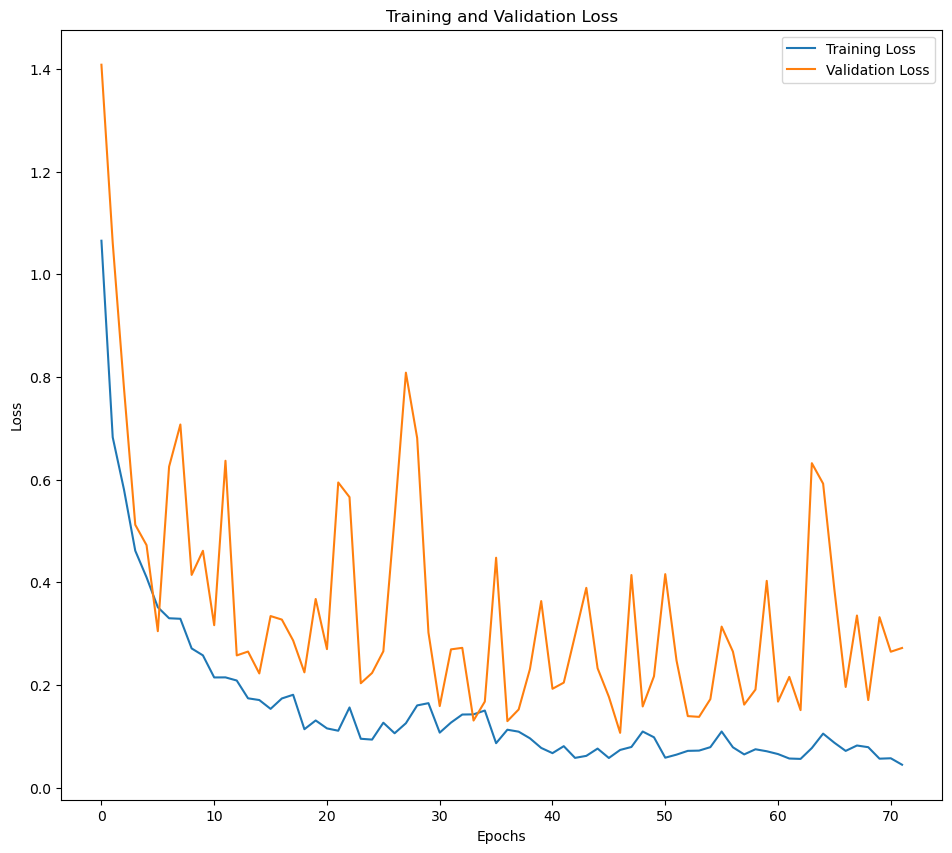

In [194]:
X = np.arange(0,72,1)
plt.figure(1, figsize = (25, 10))
plt.subplot(1,2,1)
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Training and Validation Loss")
plt.plot(X, history.history["loss"], label = "Training Loss")
plt.plot(X, history.history["val_loss"], label = "Validation Loss")
plt.legend()

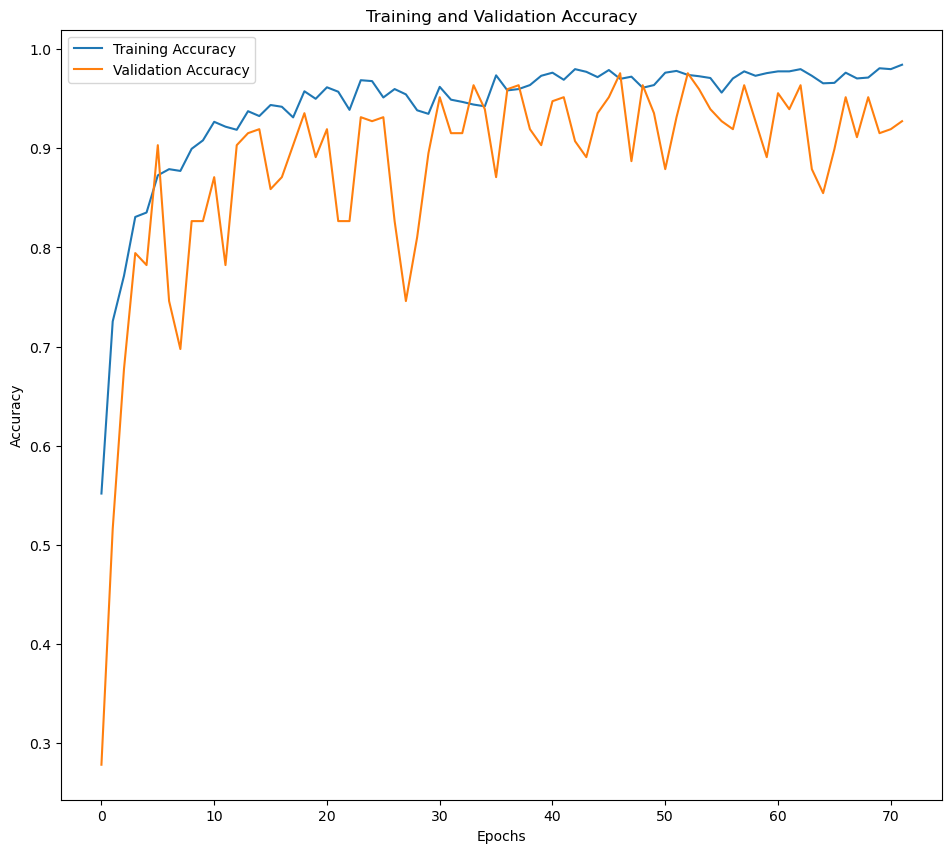

In [195]:
plt.figure(1, figsize = (25, 10))
plt.subplot(1,2,2)
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.title("Training and Validation Accuracy")
plt.plot(X, history.history["accuracy"], label = "Training Accuracy")
plt.plot(X, history.history["val_accuracy"], label = "Validation Accuracy")

plt.legend()

##### Change the optimizer function

In [211]:
from tensorflow.keras.callbacks import ModelCheckpoint,EarlyStopping
checkpoint=ModelCheckpoint(r'C:\Users\NTECH\Desktop\dataset\inceptionv3RAdamapple2.h5',
                          monitor='val_accuracy',
                          mode='max',
                          save_best_only=True,
                          verbose=1)
earlystop=EarlyStopping(monitor='val_accuracy',
                       min_delta=0,
                       patience=25,
                       verbose=0,
                       restore_best_weights=True)

callbacks=[checkpoint,earlystop]

In [212]:
import tensorflow as tf
import tensorflow_addons as tfa

# Replace the optimizer with RAdam
radam_optimizer = tfa.optimizers.RectifiedAdam()
Inceptionv3_model.compile(loss='categorical_crossentropy', 
                  optimizer=radam_optimizer,
                  metrics=['accuracy'])

In [213]:
BATCH_SIZE = 64
EPOCHS = 100
with tf.device("/device:GPU:0"): #with tf.device("/device:GPU:0"):
    history = Inceptionv3_model.fit(x = training_bottleneck_features, 
                        y = train_y,
                        validation_data = (validation_bottleneck_features, val_y),
                        batch_size = BATCH_SIZE, 
                        epochs= EPOCHS,
                         
                        callbacks=callbacks
                       )

Epoch 1/100
35/35 [==============================] - ETA: 0s - loss: 1.2966 - accuracy: 0.3946
Epoch 1: val_accuracy improved from -inf to 0.41935, saving model to C:\Users\NTECH\Desktop\dataset\inceptionv3RAdamapple2.h5
35/35 [==============================] - 5s 80ms/step - loss: 1.2966 - accuracy: 0.3946 - val_loss: 1.1714 - val_accuracy: 0.4194
Epoch 2/100
35/35 [==============================] - ETA: 0s - loss: 0.9009 - accuracy: 0.6335
Epoch 2: val_accuracy improved from 0.41935 to 0.68952, saving model to C:\Users\NTECH\Desktop\dataset\inceptionv3RAdamapple2.h5
35/35 [==============================] - 2s 56ms/step - loss: 0.9009 - accuracy: 0.6335 - val_loss: 0.7833 - val_accuracy: 0.6895
Epoch 3/100
35/35 [==============================] - ETA: 0s - loss: 0.7368 - accuracy: 0.7098
Epoch 3: val_accuracy did not improve from 0.68952
35/35 [==============================] - 2s 57ms/step - loss: 0.7368 - accuracy: 0.7098 - val_loss: 1.0256 - val_accuracy: 0.5444
Epoch 4/100
35/35 [

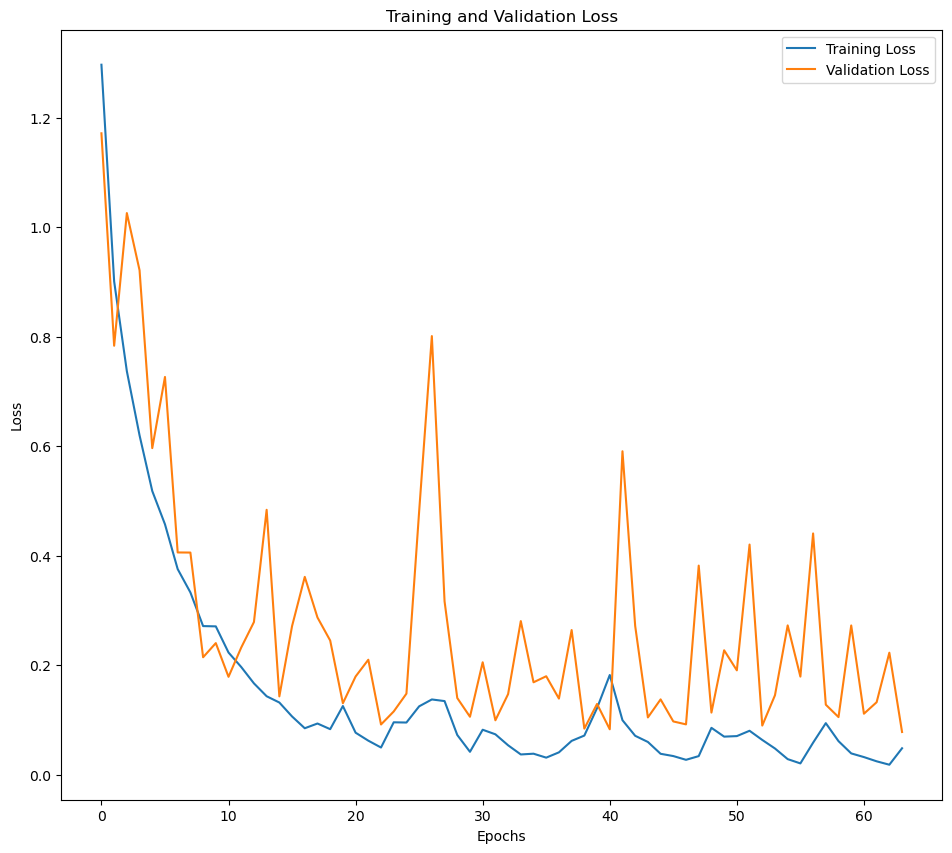

In [214]:
X = np.arange(0,64,1)
plt.figure(1, figsize = (25, 10))
plt.subplot(1,2,1)
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Training and Validation Loss")
plt.plot(X, history.history["loss"], label = "Training Loss")
plt.plot(X, history.history["val_loss"], label = "Validation Loss")
plt.legend()

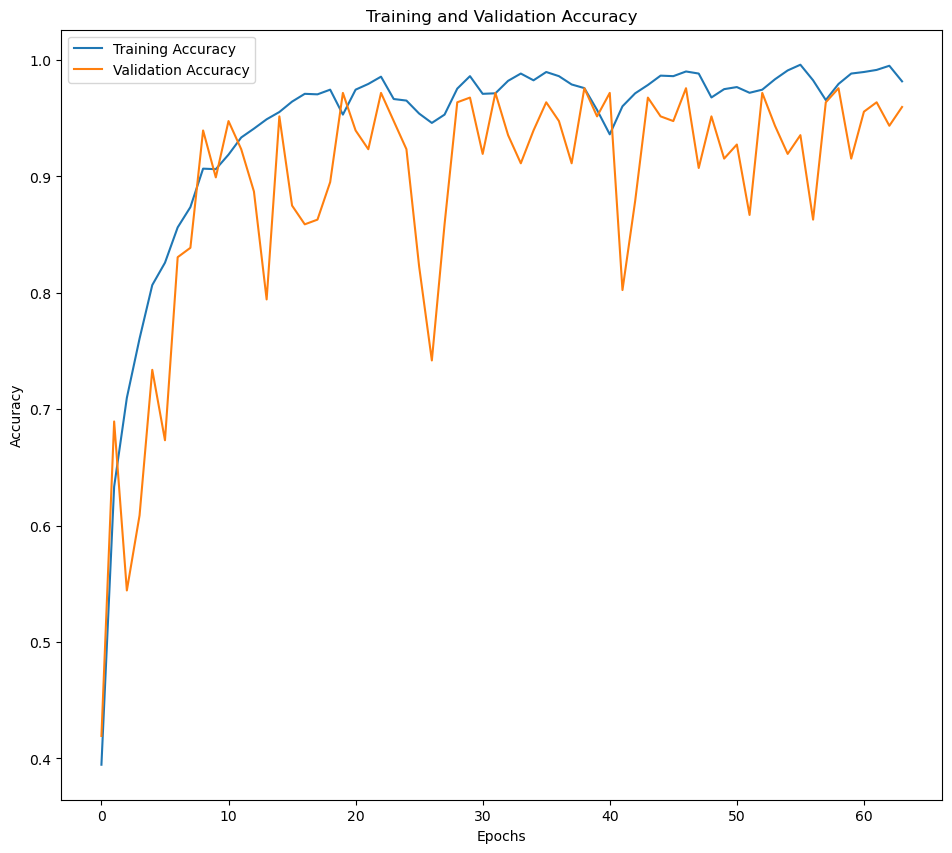

In [215]:
plt.figure(1, figsize = (25, 10))
plt.subplot(1,2,2)
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.title("Training and Validation Accuracy")
plt.plot(X, history.history["accuracy"], label = "Training Accuracy")
plt.plot(X, history.history["val_accuracy"], label = "Validation Accuracy")

plt.legend()

##### In this step we can change the learning rate[0.0001,0.0005,0.01] and change batch_size values[64, 100,138]

In [88]:
from tensorflow.keras.callbacks import ModelCheckpoint,EarlyStopping
checkpoint=ModelCheckpoint(r'C:\Users\NTECH\Desktop\dataset\0.0001inceptionv3apple2.h5',
                          monitor='val_accuracy',
                          mode='max',
                          save_best_only=True,
                          verbose=1)
earlystop=EarlyStopping(monitor='val_accuracy',
                       min_delta=0,
                       patience=25,
                       verbose=0,
                       restore_best_weights=True)

callbacks=[checkpoint,earlystop]

In [89]:
from tensorflow.keras.optimizers import Adam
optimizer = Adam(learning_rate=0.0001)

# Compile the model with the optimizer
Inceptionv3_model.compile(optimizer=optimizer, 
                        loss='categorical_crossentropy', metrics=['accuracy'])

In [90]:
BATCH_SIZE = 64
EPOCHS = 100
with tf.device("/device:GPU:0"): #with tf.device("/device:GPU:0"):
    history = Inceptionv3_model.fit(x = training_bottleneck_features, 
                        y = train_y,
                        validation_data = (validation_bottleneck_features, val_y),
                        batch_size = BATCH_SIZE, 
                        epochs= EPOCHS,
                         
                        callbacks=callbacks
                       )

Epoch 1/100
35/35 [==============================] - ETA: 0s - loss: 1.1416 - accuracy: 0.5210
Epoch 1: val_accuracy improved from -inf to 0.46371, saving model to C:\Users\NTECH\Desktop\dataset\0.0001inceptionv3apple2.h5
35/35 [==============================] - 3s 50ms/step - loss: 1.1416 - accuracy: 0.5210 - val_loss: 1.1172 - val_accuracy: 0.4637
Epoch 2/100
35/35 [==============================] - ETA: 0s - loss: 0.8712 - accuracy: 0.6540
Epoch 2: val_accuracy improved from 0.46371 to 0.58065, saving model to C:\Users\NTECH\Desktop\dataset\0.0001inceptionv3apple2.h5
35/35 [==============================] - 1s 33ms/step - loss: 0.8712 - accuracy: 0.6540 - val_loss: 0.9041 - val_accuracy: 0.5806
Epoch 3/100
35/35 [==============================] - ETA: 0s - loss: 0.7291 - accuracy: 0.7196
Epoch 3: val_accuracy did not improve from 0.58065
35/35 [==============================] - 1s 32ms/step - loss: 0.7291 - accuracy: 0.7196 - val_loss: 0.9581 - val_accuracy: 0.5685
Epoch 4/100
35/35

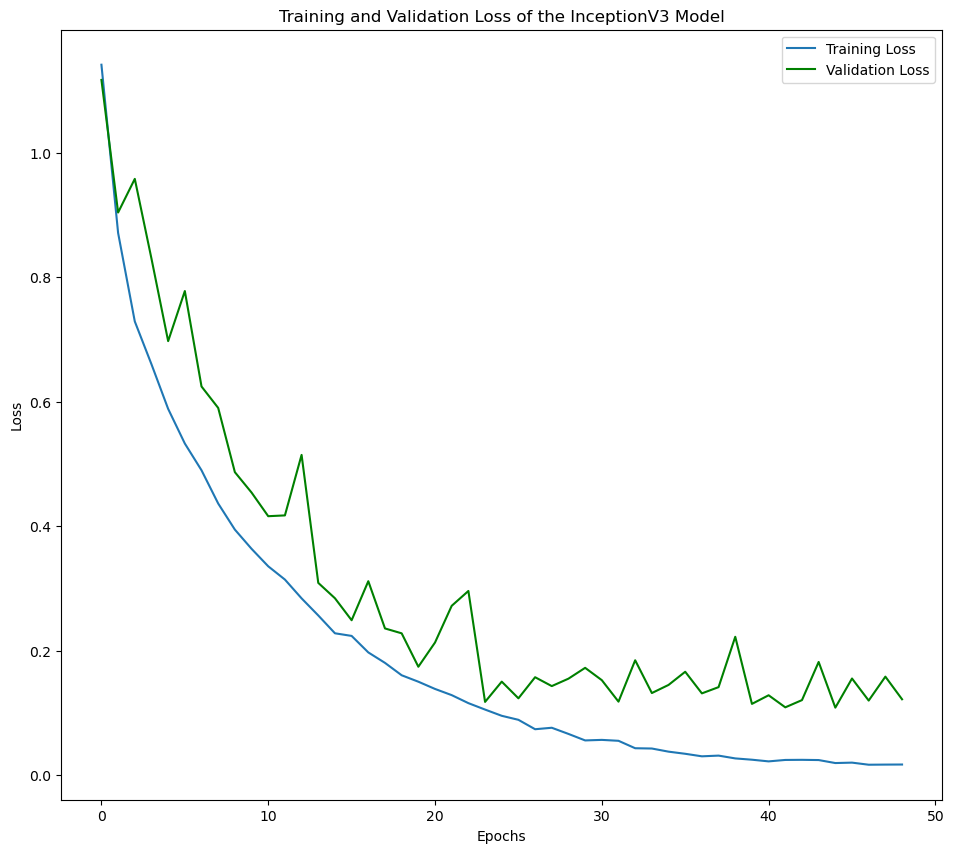

In [95]:
X = np.arange(0,49,1)
plt.figure(1, figsize = (25, 10))
plt.subplot(1,2,1)
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Training and Validation Loss of the InceptionV3 Model")
plt.plot(X, history.history["loss"], label = "Training Loss")
plt.plot(X, history.history["val_loss"], color='green',label = "Validation Loss")
plt.legend()

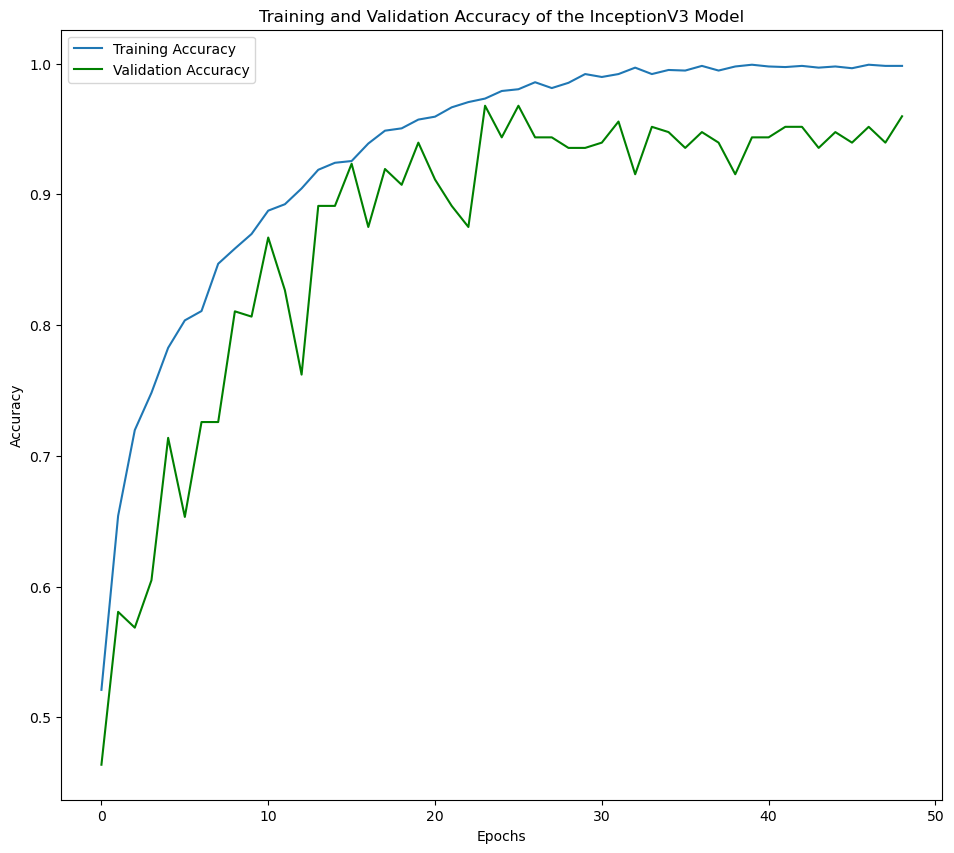

In [96]:
plt.figure(1, figsize = (25, 10))
plt.subplot(1,2,2)
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.title("Training and Validation Accuracy of the InceptionV3 Model")
plt.plot(X, history.history["accuracy"], label = "Training Accuracy")
plt.plot(X, history.history["val_accuracy"],color= 'green', label = "Validation Accuracy")

plt.legend()

# Test Our Models

###### Test vgg16 Model

In [111]:
test_data = pd.read_csv(r"C:\Users\NTECH\Desktop\test.csv")

In [112]:
image_test = r'C:\Users\NTECH\Desktop\image_test'

In [113]:
# Define image size
image_size = (224, 224)

# Define list to store images
images = []

# Loop over all image files in dataset folder
for filename in os.listdir(image_test):
    # Load image using Pillow library
    image = Image.open(os.path.join(image_test, filename))
    # Resize image to desired size
    image = image.resize(image_size)
    # Convert image to NumPy array
    image = np.array(image)
    # Add image to list
    images.append(image)

# Convert list of images to NumPy array
images = np.array(images)

In [114]:
images

array([[[[ 98, 147,  53],
         [ 96, 150,  53],
         [ 96, 150,  55],
         ...,
         [ 27,  43,  17],
         [ 28,  45,  19],
         [ 28,  46,  20]],

        [[ 98, 148,  53],
         [ 97, 151,  55],
         [ 95, 149,  54],
         ...,
         [ 27,  43,  17],
         [ 28,  46,  20],
         [ 28,  46,  20]],

        [[ 97, 149,  52],
         [ 96, 152,  53],
         [ 94, 148,  51],
         ...,
         [ 27,  43,  17],
         [ 28,  46,  20],
         [ 28,  46,  20]],

        ...,

        [[ 29,  53,  21],
         [ 28,  51,  20],
         [ 29,  48,  20],
         ...,
         [123, 159,  87],
         [116, 156,  85],
         [113, 155,  84]],

        [[ 29,  53,  20],
         [ 29,  52,  21],
         [ 33,  53,  25],
         ...,
         [121, 157,  82],
         [114, 154,  80],
         [114, 156,  81]],

        [[ 38,  64,  24],
         [ 35,  58,  23],
         [ 32,  55,  24],
         ...,
         [115, 156,  77],
        

In [115]:
images = images.astype('float32') / 255.0

In [116]:
# category - for each image_id 
def convert_dummies_to_category(df):
    data = df.copy()
    s2 = data[['healthy','multiple_diseases','rust','scab']].idxmax(axis=1)
    data = pd.concat([data,s2],axis=1)
    data.rename({0:'category'},axis=1,inplace=True)
    return data
  
# apply above function to find the category of the image
test_df = convert_dummies_to_category(test_data)
test_df.head()

,image_id,healthy,multiple_diseases,rust,scab,category
0,Test_0,0,0,1,0,rust
1,Test_1,0,0,1,0,rust
2,Test_2,0,0,0,1,scab
3,Test_3,1,0,0,0,healthy
4,Test_4,0,0,1,0,rust


In [117]:
class_names =['healthy','multiple_diseases','rust','scab']

In [118]:
# Get true class names from im filenames
true_class_names= test_df.category

#### DenseNet

In [119]:
from tensorflow.keras.models import load_model

DenseNetmodel = load_model(r'C:\Users\NTECH\Desktop\dataset\0.0001densenetapple2.h5')

In [120]:
test_bottleneck_features = get_bottleneck_features(densenet_model , images)

1/1 [==============================] - 2s 2s/step


In [121]:
y_predDenseNet = DenseNetmodel.predict(test_bottleneck_features )


1/1 [==============================] - 0s 132ms/step


In [122]:
# Convert predictions to class names
predicted_class_names = [class_names[np.argmax(pred)] for pred in y_predDenseNet]

In [123]:
# Print predicted class names for first five images
print("Predicted classes:", predicted_class_names[:5])

Predicted classes: ['rust', 'rust', 'scab', 'healthy', 'rust']


In [124]:
# Print true class names for first five images
print("True classes:", true_class_names[:5])

True classes: 0       rust
1       rust
2       scab
3    healthy
4       rust
Name: category, dtype: object


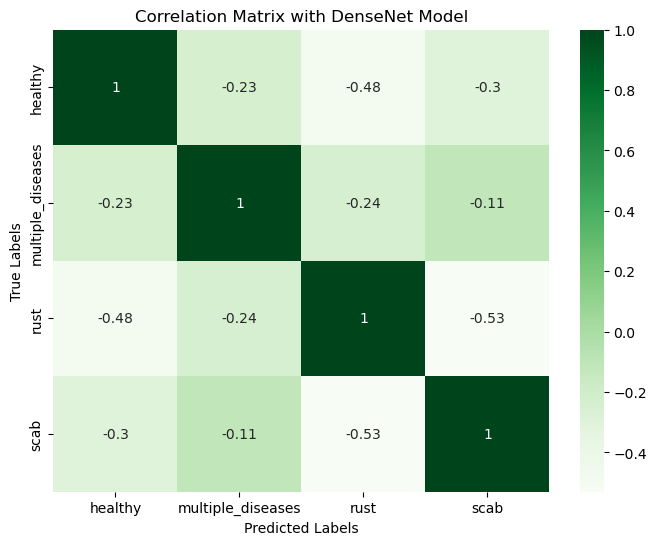

In [125]:
# Plot correlation matrix
corr = np.corrcoef(y_predDenseNet.T)
plt.figure(figsize=(8, 6))
sns.heatmap(corr, annot=True, cmap="Greens", xticklabels=class_names, yticklabels=class_names)
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Correlation Matrix with DenseNet Model")

plt.show()


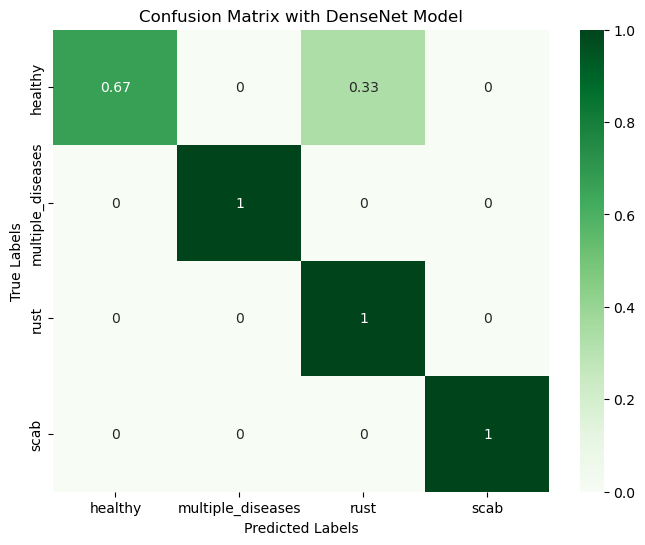

In [126]:
# Plot confusion matrix
from sklearn.metrics import confusion_matrix
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt

# Calculate the confusion matrix
cm = confusion_matrix(true_class_names, predicted_class_names, labels=class_names)

# Convert counts to probabilities
cm_sum = np.sum(cm, axis=1, keepdims=True)
cm_prob = cm.astype('float') / cm_sum

# Plot the confusion matrix with probabilities
plt.figure(figsize=(8, 6))
sns.heatmap(cm_prob, annot=True, cmap="Greens", xticklabels=class_names, yticklabels=class_names)
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Confusion Matrix with DenseNet Model")

plt.show()


In [127]:
#classification report
from sklearn.metrics import classification_report

print(classification_report(true_class_names,predicted_class_names))

                   precision    recall  f1-score   support

          healthy       1.00      0.67      0.80         3
multiple_diseases       1.00      1.00      1.00         1
             rust       0.80      1.00      0.89         4
             scab       1.00      1.00      1.00         2

         accuracy                           0.90        10
        macro avg       0.95      0.92      0.92        10
     weighted avg       0.92      0.90      0.90        10



In [419]:
#classification accuracy measurement
from sklearn import metrics
ac=metrics.accuracy_score(true_class_names,predicted_class_names)
print(ac)

0.9


###### InceptionV3

In [65]:
#New attempt

from tensorflow.keras.models import load_model

inceptionv3 = load_model(r'C:\Users\NTECH\Desktop\dataset\0.0001inceptionv3apple2.h5')

In [66]:
test_bottleneck_features = get_bottleneck_features(inceptionv3_model, images)

1/1 [==============================] - 4s 4s/step


In [68]:
y_pred = inceptionv3.predict(test_bottleneck_features)

1/1 [==============================] - 0s 52ms/step


In [69]:
# Convert predictions to class names
predicted_class_names = [class_names[np.argmax(pred)] for pred in y_pred]

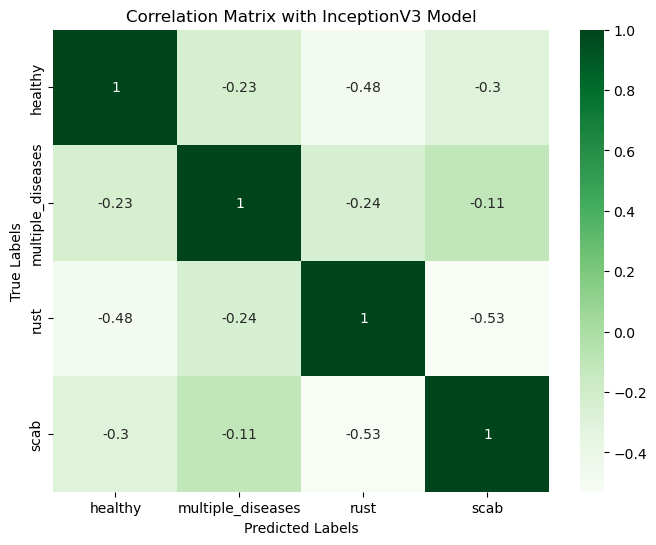

In [70]:
# Plot correlation matrix
corr = np.corrcoef(y_predDenseNet.T)
plt.figure(figsize=(8, 6))
sns.heatmap(corr, annot=True, cmap="Greens", xticklabels=class_names, yticklabels=class_names)
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Correlation Matrix with InceptionV3 Model")

plt.show()


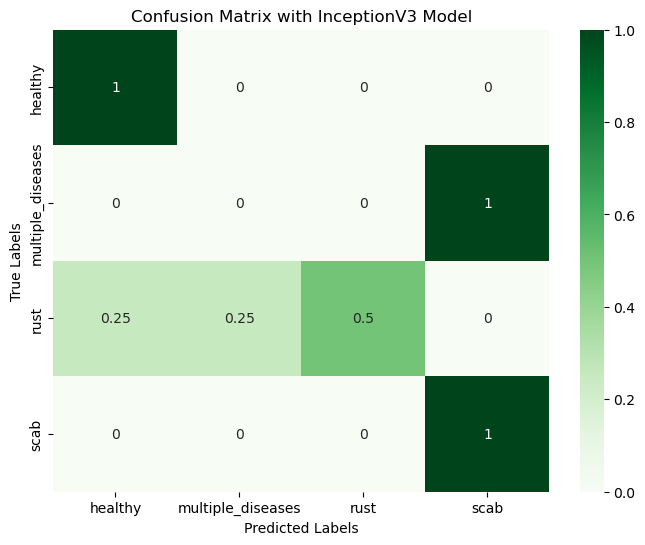

In [71]:
# Plot confusion matrix
from sklearn.metrics import confusion_matrix
import seaborn as sns

# Calculate the confusion matrix
cm = confusion_matrix(true_class_names, predicted_class_names, labels=class_names)

# Convert counts to probabilities
cm_sum = np.sum(cm, axis=1, keepdims=True)
cm_prob = cm.astype('float') / cm_sum

# Plot the confusion matrix with probabilities
plt.figure(figsize=(8, 6))
sns.heatmap(cm_prob, annot=True, cmap="Greens", xticklabels=class_names, yticklabels=class_names)
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Confusion Matrix with InceptionV3 Model")

plt.show()

In [72]:
#classification report
from sklearn.metrics import classification_report

print(classification_report(true_class_names,predicted_class_names))

                   precision    recall  f1-score   support

          healthy       0.75      1.00      0.86         3
multiple_diseases       0.00      0.00      0.00         1
             rust       1.00      0.50      0.67         4
             scab       0.67      1.00      0.80         2

         accuracy                           0.70        10
        macro avg       0.60      0.62      0.58        10
     weighted avg       0.76      0.70      0.68        10



In [73]:
#classification accuracy measurement
from sklearn import metrics
ac=metrics.accuracy_score(true_class_names,predicted_class_names)
print(ac)

0.7


#### CNN

In [74]:
#New attempt

from tensorflow.keras.models import load_model

cnn_model = load_model(r'C:\Users\NTECH\Desktop\dataset\0.0001CNNapple2.h5')

In [75]:
y_pred = cnn_model.predict(images)

1/1 [==============================] - 1s 558ms/step


In [76]:
# Convert predictions to class names
predicted_class_names = [class_names[np.argmax(pred)] for pred in y_pred]

In [77]:
# Print predicted class names for first five images
print("Predicted classes:", predicted_class_names[:5])

Predicted classes: ['scab', 'rust', 'scab', 'healthy', 'scab']


In [78]:
# Print true class names for first five images
print("True classes:", true_class_names[:5])

True classes: 0       rust
1       rust
2       scab
3    healthy
4       rust
Name: category, dtype: object


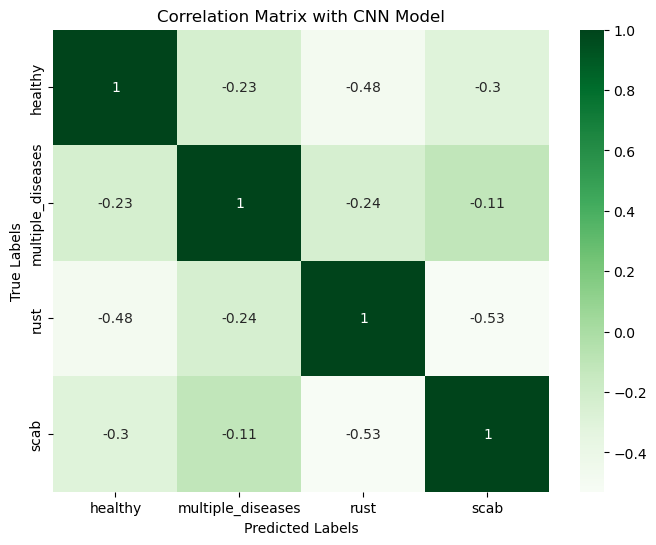

In [79]:
# Plot correlation matrix
corr = np.corrcoef(y_predDenseNet.T)
plt.figure(figsize=(8, 6))
sns.heatmap(corr, annot=True, cmap="Greens", xticklabels=class_names, yticklabels=class_names)
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Correlation Matrix with CNN Model")

plt.show()


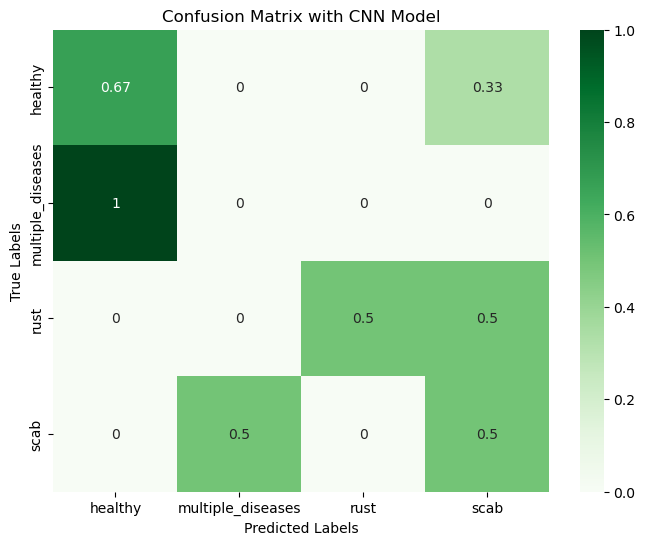

In [80]:
# Plot confusion matrix
from sklearn.metrics import confusion_matrix
import seaborn as sns

# Calculate the confusion matrix
cm = confusion_matrix(true_class_names, predicted_class_names, labels=class_names)

# Convert counts to probabilities
cm_sum = np.sum(cm, axis=1, keepdims=True)
cm_prob = cm.astype('float') / cm_sum

# Plot the confusion matrix with probabilities
plt.figure(figsize=(8, 6))
sns.heatmap(cm_prob, annot=True, cmap="Greens", xticklabels=class_names, yticklabels=class_names)
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Confusion Matrix with CNN Model")

plt.show()

In [81]:
#classification report
from sklearn.metrics import classification_report

print(classification_report(true_class_names,predicted_class_names))

                   precision    recall  f1-score   support

          healthy       0.67      0.67      0.67         3
multiple_diseases       0.00      0.00      0.00         1
             rust       1.00      0.50      0.67         4
             scab       0.25      0.50      0.33         2

         accuracy                           0.50        10
        macro avg       0.48      0.42      0.42        10
     weighted avg       0.65      0.50      0.53        10



In [82]:
#classification accuracy measurement
from sklearn import metrics
ac=metrics.accuracy_score(true_class_names,predicted_class_names)
print(ac)

0.5


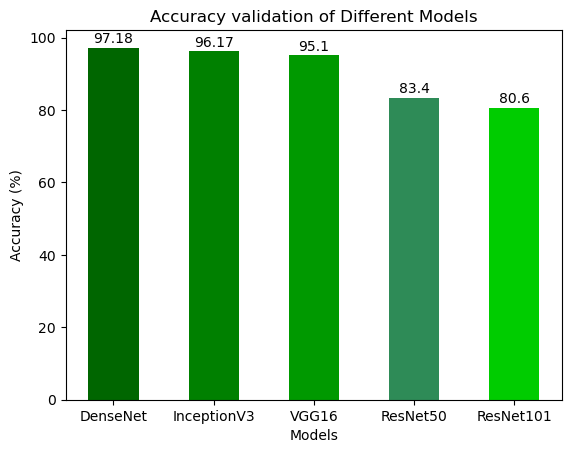

In [1]:
# Data
Models = ['DenseNet','InceptionV3','VGG16','ResNet50','ResNet101', ]
Accuracy = [97.18,96.17,95.1,83.4, 80.6,]

# Generate a list of colors for each bar
colors = [ '#006600','#008000', '#009900','#2E8B57','#00CC00']

# Plotting the histogram with value labels and different colors for each bar
for i in range(len(Models)):
    plt.bar(Models[i], Accuracy[i],width=0.5,color=colors[i])
    plt.text(Models[i], Accuracy[i] + 0.5, str(Accuracy[i]), ha='center', va='bottom')

# Adding labels and title
plt.xlabel('Models')
plt.ylabel('Accuracy (%)')
plt.title('Accuracy validation of Different Models')

# Display the histogram
plt.show()

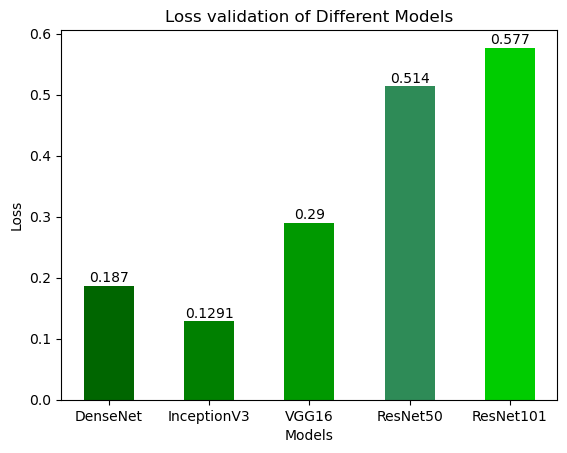

In [2]:
# Data
Models = ['DenseNet','InceptionV3','VGG16','ResNet50','ResNet101', ]
Loss = [0.1870,0.1291,0.29,0.514,0.577,]

# Generate a list of colors for each bar
colors = [ '#006600','#008000', '#009900','#2E8B57','#00CC00']

# Plotting the histogram with value labels and different colors for each bar
for i in range(len(Models)):
    plt.bar(Models[i], Loss[i],width=0.5,color=colors[i])
    plt.text(Models[i], Loss[i] + 0.001, str(Loss[i]), ha='center', va='bottom')
    
# Adding labels and title
plt.xlabel('Models')
plt.ylabel('Loss')
plt.title('Loss validation of Different Models')

# Display the histogram
plt.show()


In [11]:
%%html
<img src='Desktop/hana/thank.jfif',width=40000, height=40000, center>